In [2]:
## Import Modules
from sklearn.feature_selection import RFECV
from sklearn.feature_selection import RFE
import statsmodels.api as sm
from sklearn.metrics import completeness_score, homogeneity_score
from sklearn.cluster import KMeans
from sklearn.model_selection import GridSearchCV
import math
from sklearn import feature_selection
import graphviz
from sklearn import metrics
from sklearn.tree import export_graphviz
from sklearn import cross_validation
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn import tree
import seaborn as sns
from sklearn import preprocessing
import numpy as np
import pandas as pd
import os
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
3#from sklearn import tree, naive_bayes
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

C:\Users\lenovo\Anaconda2\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [3]:
##get working directory
os.getcwd()

'C:\\Depaul_Win7\\DSC 478 Machine Learning\\Final Project\\health_adult'

In [4]:
os.chdir('C:\\Depaul_Win7\\DSC 478 Machine Learning\\Final Project\\health_adult')

In [5]:
##load data via read_csv
health_df = pd.read_csv('samadult.csv', sep=",")
health_df.head()

,FPX,FMX,HHX,INTV_QRT,WTIA_SA,WTFA_SA,SEX,HISPAN_I,R_MARITL,MRACRPI2,...,MBO_PRO1,YTQU_YG1,YTQ_BTY1,YTQ_MDY1,YTQU_TA1,YTQ_BTT1,YTQ_MDT1,YTQU_QG1,YTQ_BTQ1,YTQ_MDQ1
0,1,1,3,1,5829.3,5044,2,12,4,1,...,2,2,NaN,NaN,2,NaN,NaN,2,NaN,NaN
1,1,1,9,1,2752.4,3770,1,12,7,1,...,2,2,NaN,NaN,2,NaN,NaN,2,NaN,NaN
2,2,1,11,1,14902.0,17305,1,12,1,1,...,2,2,NaN,NaN,2,NaN,NaN,2,NaN,NaN
3,1,1,15,1,8531.8,7383,2,12,5,1,...,2,1,1.0,1.0,1,1.0,2.0,2,NaN,NaN
4,1,1,18,1,5477.2,8314,1,0,1,1,...,2,1,1.0,1.0,2,NaN,NaN,2,NaN,NaN


In [6]:
#check types
health_df.dtypes

FPX           int64
FMX           int64
HHX           int64
INTV_QRT      int64
WTIA_SA     float64
WTFA_SA       int64
SEX           int64
HISPAN_I      int64
R_MARITL      int64
MRACRPI2      int64
RACERPI2      int64
MRACBPI2      int64
AGE_P         int64
RECTYPE       int64
SRVY_YR       int64
INTV_MON      int64
REGION        int64
PSTRAT        int64
PPSU          int64
PROX1       float64
PROX2       float64
LATEINTA      int64
PROXYSA       int64
PAR_STAT      int64
FDRN_FLG      int64
DOINGLWA      int64
WHYNOWKA    float64
EVERWRK     float64
SUPERVIS    float64
WRKCATA     float64
             ...   
AWEBUSE       int64
AWEBOFNO    float64
AWEBOFTP    float64
AWEBEML       int64
AWEBMNO     float64
AWEBMTP     float64
NAT_USM1      int64
CHE_USM1      int64
TRD_USM1      int64
TR_USM21    float64
TR_USM22    float64
TR_USM23    float64
TR_USM24    float64
TR_USM25    float64
TR_USM26    float64
HOM_USM1      int64
MBO_MAN1      int64
MBO_MND1      int64
MBO_SPR1      int64


In [7]:
columnNames = list(health_df.head(0))
print(columnNames)

['FPX', 'FMX', 'HHX', 'INTV_QRT', 'WTIA_SA', 'WTFA_SA', 'SEX', 'HISPAN_I', 'R_MARITL', 'MRACRPI2', 'RACERPI2', 'MRACBPI2', 'AGE_P', 'RECTYPE', 'SRVY_YR', 'INTV_MON', 'REGION', 'PSTRAT', 'PPSU', 'PROX1', 'PROX2', 'LATEINTA', 'PROXYSA', 'PAR_STAT', 'FDRN_FLG', 'DOINGLWA', 'WHYNOWKA', 'EVERWRK', 'SUPERVIS', 'WRKCATA', 'BUSINC1A', 'LOCALL1B', 'WRKLONGH', 'HOURPDA', 'PDSICKA', 'ONEJOB', 'WRKLYR4', 'INDSTRN1', 'INDSTRN2', 'OCCUPN1', 'OCCUPN2', 'YRSWRKPA', 'DIFAGE2', 'HYPEV', 'HYPDIFV', 'HYBPCKNO', 'HYBPCKTP', 'HYBPLEV', 'HYPMDEV2', 'HYPMED2', 'CHLEV', 'CHLYR', 'CLCKNO', 'CLCKTP', 'CHLMDEV2', 'CHLMDNW2', 'CHDEV', 'ANGEV', 'MIEV', 'HRTEV', 'STREV', 'EPHEV', 'JAWP', 'WEA', 'CHE', 'ARM', 'BRTH', 'AHADO', 'FACE', 'SPEAKING', 'EYE', 'WALKING', 'HEADACHE', 'ASTDO', 'COPDEV', 'ASPMEDEV', 'ASPMEDAD', 'ASPMDMED', 'ASPONOWN', 'AASMEV', 'AASSTILL', 'AASMYR', 'AASERYR1', 'ULCEV', 'ULCYR', 'CANEV', 'CNKIND1', 'CNKIND2', 'CNKIND3', 'CNKIND4', 'CNKIND5', 'CNKIND6', 'CNKIND7', 'CNKIND8', 'CNKIND9', 'CNKIND10

In [8]:
#create reduced dataframe

In [9]:
#create reduced dataframe
health_red = health_df[['SEX',	'R_MARITL',	'MRACRPI2',	'REGION',	'PAR_STAT',	'DOINGLWA',	'SUPERVIS',	'WRKCATA',	'HOURPDA',	'PDSICKA',	'WRKLYR4',	'HYPEV',	'HYBPLEV',	'CHLEV',	'CHDEV',	'MIEV',	'STREV',	'COPDEV',	'AASMEV',	'ULCEV',	'CANEV',	'DBHVPAY',	'DBHVCLY',	'DBHVWLY',	'DBHVPAN',	'DBHVCLN',	'DBHVWLN',	'DIBREL',	'DIBEV1',	'DIBPRE2',	'EPILEP1',	'AHAYFYR',	'SINYR',	'CBRCHYR',	'KIDWKYR',	'LIVYR',	'JNTSYMP',	'ARTH1',	'PAINECK',	'PAINLB',	'PAINFACE',	'AMIGR',	'ACOLD2W',	'AINTIL2W',	'AHEARST1',	'AVISION',	'VIM_GLEV',	'VIM_MDEV',	'VIMGLASS',	'AVISACT',	'CHPAIN6M',	'AHSTATYR',	'FLA1AR',	'SPECEQ',	'ALC1YR',	'CIGAREV2',	'ECIGEV2',	'SMKSTAT2',	'APLKIND',	'AWORPAY',	'ADNLONG2',	'ASRGYR',	'AMDLONGR',	'HIT1A',	'HIT2A',	'HIT3A',	'HIT4A',	'FLUVACYR',	'LIVEV',	'ASICPUSE',	'ASIRETR',	'ASIMEDC',	'ASISTLV',	'ASICNHC',	'AWEBUSE',	'YTQU_YG1','ALCSTAT','YRSWRKPA',	'ASISLEEP',	'AHEIGHT',	'AWEIGHTP',	'BMI',	'BEDDAYR',	'CLCKTP',	'AGE_P',	'AHCNOYR2',	'LOCALL1B']]

In [10]:
#recode race
health_red['MRACRPI2'] = health_red['MRACRPI2'].replace([9,10,11,15,16,17], 4)

C:\Users\lenovo\Anaconda2\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


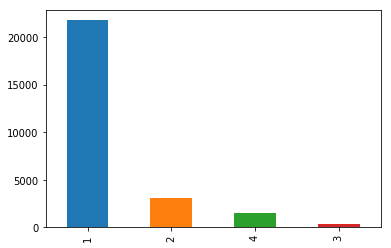

In [11]:
health_red['MRACRPI2'].value_counts().plot(kind='bar')

In [12]:
health_red.columns.get_loc("R_MARITL")

1

In [13]:
#recode marital status
health_red['R_MARITL'] = health_red['R_MARITL'].replace([2,3], 1) #married

C:\Users\lenovo\Anaconda2\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [14]:
health_red['R_MARITL'] = health_red['R_MARITL'].replace([4], 2) #widowed

C:\Users\lenovo\Anaconda2\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [15]:
health_red['R_MARITL'] = health_red['R_MARITL'].replace([5,6], 3) #divorced

C:\Users\lenovo\Anaconda2\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [16]:
health_red['R_MARITL'] = health_red['R_MARITL'].replace([7,8,9], 4) #never married

C:\Users\lenovo\Anaconda2\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


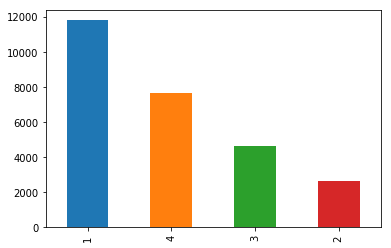

In [17]:
health_red['R_MARITL'].value_counts().plot(kind='bar')

In [18]:
#recode missing values in part of dataframe
health_nan = health_red.iloc[:,0:76].replace([7,8,9], np.nan)
health_nan2 = health_red.iloc[:,76]
health_nan3 = pd.concat([health_nan,health_nan2],axis=1,join_axes=[health_nan.index])
health_nan3.head()


,SEX,R_MARITL,MRACRPI2,REGION,PAR_STAT,DOINGLWA,SUPERVIS,WRKCATA,HOURPDA,PDSICKA,...,FLUVACYR,LIVEV,ASICPUSE,ASIRETR,ASIMEDC,ASISTLV,ASICNHC,AWEBUSE,YTQU_YG1,ALCSTAT
0,2,2,1,3,3,5.0,2.0,1.0,1.0,2.0,...,1.0,2.0,4.0,3.0,4.0,4.0,4.0,1.0,2.0,6
1,1,4,1,2,3,5.0,2.0,1.0,1.0,2.0,...,1.0,2.0,4.0,3.0,3.0,3.0,3.0,1.0,2.0,7
2,1,1,1,2,1,1.0,2.0,1.0,1.0,1.0,...,2.0,2.0,3.0,3.0,2.0,2.0,3.0,1.0,2.0,6
3,2,3,1,2,3,1.0,2.0,1.0,1.0,1.0,...,1.0,2.0,4.0,2.0,4.0,4.0,4.0,1.0,1.0,6
4,1,1,1,3,1,1.0,1.0,1.0,1.0,1.0,...,2.0,2.0,4.0,1.0,1.0,3.0,2.0,1.0,1.0,6


In [19]:
health_nan3.shape

(26742, 77)

In [20]:
#recode values in rest of dataframe to merge
health_rest = health_red.iloc[:,77:87].replace([96,97,98,99,996,997,998,999,9999], np.nan)
health_rest.head()

,YRSWRKPA,ASISLEEP,AHEIGHT,AWEIGHTP,BMI,BEDDAYR,CLCKTP,AGE_P,AHCNOYR2,LOCALL1B
0,28.0,8.0,61.0,155.0,2930.0,0.0,4,65,2.0,5.0
1,0.0,6.0,74.0,180.0,2309.0,3.0,9,19,2.0,NaN
2,13.0,5.0,69.0,240.0,3544.0,4.0,3,45,0.0,8.0
3,13.0,8.0,62.0,236.0,4313.0,6.0,1,67,3.0,6.0
4,16.0,8.0,63.0,182.0,3227.0,0.0,3,40,2.0,9.0


In [21]:
health_rest.shape

(26742, 10)

In [22]:
#merge dataframes with values 7,8,9,96,97,98,99,996,997,998,999,9999 recoded to NaN
mergedf=pd.concat([health_nan3,health_rest],axis=1,join_axes=[health_nan3.index])
mergedf.head()

,SEX,R_MARITL,MRACRPI2,REGION,PAR_STAT,DOINGLWA,SUPERVIS,WRKCATA,HOURPDA,PDSICKA,...,YRSWRKPA,ASISLEEP,AHEIGHT,AWEIGHTP,BMI,BEDDAYR,CLCKTP,AGE_P,AHCNOYR2,LOCALL1B
0,2,2,1,3,3,5.0,2.0,1.0,1.0,2.0,...,28.0,8.0,61.0,155.0,2930.0,0.0,4,65,2.0,5.0
1,1,4,1,2,3,5.0,2.0,1.0,1.0,2.0,...,0.0,6.0,74.0,180.0,2309.0,3.0,9,19,2.0,NaN
2,1,1,1,2,1,1.0,2.0,1.0,1.0,1.0,...,13.0,5.0,69.0,240.0,3544.0,4.0,3,45,0.0,8.0
3,2,3,1,2,3,1.0,2.0,1.0,1.0,1.0,...,13.0,8.0,62.0,236.0,4313.0,6.0,1,67,3.0,6.0
4,1,1,1,3,1,1.0,1.0,1.0,1.0,1.0,...,16.0,8.0,63.0,182.0,3227.0,0.0,3,40,2.0,9.0


In [23]:
mergedf['LOCALL1B'].shape

(26742L,)

In [24]:
#test.isna().sum()
print(mergedf.isna().sum().to_string())

SEX            0
R_MARITL       0
MRACRPI2       0
REGION         0
PAR_STAT       0
DOINGLWA      10
SUPERVIS    1212
WRKCATA     1302
HOURPDA     1285
PDSICKA     1529
WRKLYR4       40
HYPEV         36
HYBPLEV      831
CHLEV        112
CHDEV         56
MIEV          20
STREV         20
COPDEV        36
AASMEV        22
ULCEV         30
CANEV         19
DBHVPAY       35
DBHVCLY       32
DBHVWLY       25
DBHVPAN       21
DBHVCLN       27
DBHVWLN       14
DIBREL       405
DIBEV1        20
DIBPRE2     2839
EPILEP1       13
AHAYFYR       28
SINYR         31
CBRCHYR       19
KIDWKYR       20
LIVYR         17
JNTSYMP       19
ARTH1         36
PAINECK       20
PAINLB        15
PAINFACE      14
AMIGR         15
ACOLD2W       16
AINTIL2W      14
AHEARST1       8
AVISION        9
VIM_GLEV      46
VIM_MDEV      53
VIMGLASS     128
AVISACT       13
CHPAIN6M      42
AHSTATYR      26
FLA1AR         0
SPECEQ         9
ALC1YR       194
CIGAREV2     106
ECIGEV2       92
SMKSTAT2      99
APLKIND     33

In [25]:
#remove NAs
health_na = mergedf.dropna()

In [26]:
#check number of NAs
health_na.isnull().sum().sum()

0

In [27]:
health_na.shape

(15913, 87)

In [28]:
health_na['LOCALL1B'].shape

(15913L,)

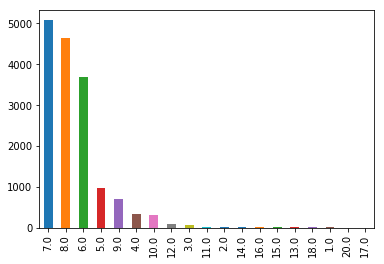

In [29]:
health_na['ASISLEEP'].value_counts().plot(kind='bar')

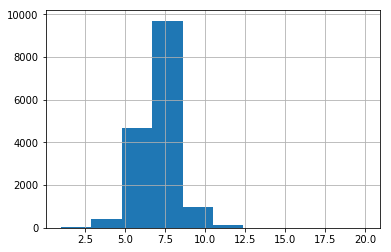

In [30]:
health_na['ASISLEEP'].hist()

In [31]:
health_na.describe()

,SEX,R_MARITL,MRACRPI2,REGION,PAR_STAT,DOINGLWA,SUPERVIS,WRKCATA,HOURPDA,PDSICKA,...,YRSWRKPA,ASISLEEP,AHEIGHT,AWEIGHTP,BMI,BEDDAYR,CLCKTP,AGE_P,AHCNOYR2,LOCALL1B
count,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000,...,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000,15913.000000
mean,1.560171,2.211337,1.282473,2.650035,2.470433,2.462201,1.632879,1.760887,1.451706,1.386162,...,11.317979,7.043926,66.759693,174.755986,2749.213787,4.477283,3.224408,50.862188,2.732294,4.780431
std,0.496382,1.286954,0.737698,1.018002,0.864585,1.875317,0.482035,1.351432,0.497678,0.486884,...,10.756068,1.285489,3.881437,38.444969,530.688215,24.796872,1.492853,17.992640,2.129829,2.528555
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,1.000000,59.000000,100.000000,1522.000000,0.000000,0.000000,18.000000,0.000000,1.000000
25%,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,2.000000,6.000000,64.000000,145.000000,2366.000000,0.000000,3.000000,36.000000,1.000000,3.000000
50%,2.000000,2.000000,1.000000,3.000000,3.000000,1.000000,2.000000,1.000000,1.000000,1.000000,...,8.000000,7.000000,66.000000,170.000000,2662.000000,0.000000,3.000000,51.000000,2.000000,4.000000
75%,2.000000,4.000000,1.000000,3.000000,3.000000,5.000000,2.000000,2.000000,2.000000,2.000000,...,18.000000,8.000000,70.000000,200.000000,3056.000000,2.000000,4.000000,65.000000,4.000000,7.000000
max,2.000000,4.000000,4.000000,4.000000,3.000000,5.000000,2.000000,6.000000,2.000000,2.000000,...,35.000000,20.000000,76.000000,299.000000,5274.000000,365.000000,9.000000,85.000000,8.000000,9.000000


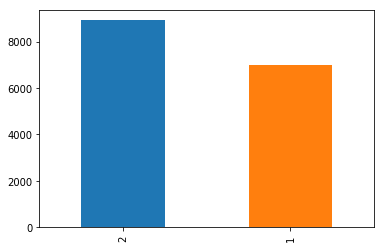

In [32]:

health_na[health_na.columns[0]].value_counts().plot(kind='bar')


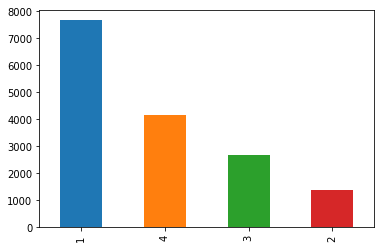

In [33]:
health_na[health_na.columns[1]].value_counts().plot(kind='bar')

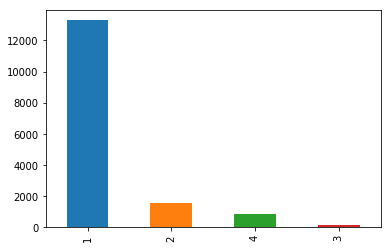

In [34]:
health_na[health_na.columns[2]].value_counts().plot(kind='bar')

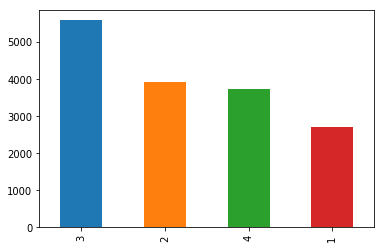

In [35]:
health_na[health_na.columns[3]].value_counts().plot(kind='bar')

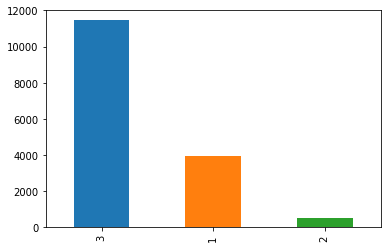

In [36]:
health_na[health_na.columns[4]].value_counts().plot(kind='bar')

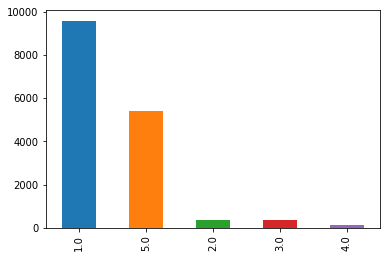

In [37]:
health_na[health_na.columns[5]].value_counts().plot(kind='bar')

In [38]:
#plot all variables
# matplotlib.style.use('ggplot')
# health_na.plot.bar(subplots=True)

In [39]:
#save data frame without NAs to csv file
health_na.to_csv('health_na.csv', sep=",")

In [40]:
#create reduced categorical dataframe
health_cat = health_na[['SEX',	'R_MARITL',	'MRACRPI2',	'REGION',	'PAR_STAT',	'DOINGLWA',	'SUPERVIS',	'WRKCATA',	'HOURPDA',	'PDSICKA',	'WRKLYR4',	'HYPEV',	'HYBPLEV',	'CHLEV',	'CHDEV',	'MIEV',	'STREV',	'COPDEV',	'AASMEV',	'ULCEV',	'CANEV',	'DBHVPAY',	'DBHVCLY',	'DBHVWLY',	'DBHVPAN',	'DBHVCLN',	'DBHVWLN',	'DIBREL',	'DIBEV1',	'DIBPRE2',	'EPILEP1',	'AHAYFYR',	'SINYR',	'CBRCHYR',	'KIDWKYR',	'LIVYR',	'JNTSYMP',	'ARTH1',	'PAINECK',	'PAINLB',	'PAINFACE',	'AMIGR',	'ACOLD2W',	'AINTIL2W',	'AHEARST1',	'AVISION',	'VIM_GLEV',	'VIM_MDEV',	'VIMGLASS',	'AVISACT',	'CHPAIN6M',	'AHSTATYR',	'FLA1AR',	'SPECEQ',	'ALC1YR',	'CIGAREV2',	'ECIGEV2',	'SMKSTAT2',	'APLKIND',	'AWORPAY',	'ADNLONG2',	'ASRGYR',	'AMDLONGR',	'HIT1A',	'HIT2A',	'HIT3A',	'HIT4A',	'FLUVACYR',	'LIVEV',	'ASICPUSE',	'ASIRETR',	'ASIMEDC',	'ASISTLV',	'ASICNHC',	'AWEBUSE',	'YTQU_YG1',	'ALCSTAT']]

In [41]:
health_cat.head()

,SEX,R_MARITL,MRACRPI2,REGION,PAR_STAT,DOINGLWA,SUPERVIS,WRKCATA,HOURPDA,PDSICKA,...,FLUVACYR,LIVEV,ASICPUSE,ASIRETR,ASIMEDC,ASISTLV,ASICNHC,AWEBUSE,YTQU_YG1,ALCSTAT
0,2,2,1,3,3,5.0,2.0,1.0,1.0,2.0,...,1.0,2.0,4.0,3.0,4.0,4.0,4.0,1.0,2.0,6
2,1,1,1,2,1,1.0,2.0,1.0,1.0,1.0,...,2.0,2.0,3.0,3.0,2.0,2.0,3.0,1.0,2.0,6
3,2,3,1,2,3,1.0,2.0,1.0,1.0,1.0,...,1.0,2.0,4.0,2.0,4.0,4.0,4.0,1.0,1.0,6
4,1,1,1,3,1,1.0,1.0,1.0,1.0,1.0,...,2.0,2.0,4.0,1.0,1.0,3.0,2.0,1.0,1.0,6
6,2,3,1,2,3,5.0,1.0,5.0,2.0,2.0,...,1.0,2.0,2.0,2.0,3.0,3.0,4.0,1.0,2.0,6


In [42]:
#check number of NAs
health_cat.isnull().sum().sum()

0

In [43]:
health_cat.shape

(15913, 77)

In [44]:
#create reduced numerical dataframe
health_num = health_na[['YRSWRKPA',	'ASISLEEP',	'AHEIGHT',	'AWEIGHTP',	'BMI',	'BEDDAYR',	'CLCKTP',	'AGE_P',	'AHCNOYR2',	'LOCALL1B']]

In [45]:
health_num.head()

,YRSWRKPA,ASISLEEP,AHEIGHT,AWEIGHTP,BMI,BEDDAYR,CLCKTP,AGE_P,AHCNOYR2,LOCALL1B
0,28.0,8.0,61.0,155.0,2930.0,0.0,4,65,2.0,5.0
2,13.0,5.0,69.0,240.0,3544.0,4.0,3,45,0.0,8.0
3,13.0,8.0,62.0,236.0,4313.0,6.0,1,67,3.0,6.0
4,16.0,8.0,63.0,182.0,3227.0,0.0,3,40,2.0,9.0
6,22.0,7.0,62.0,135.0,2467.0,0.0,3,79,2.0,3.0


In [46]:
health_num['LOCALL1B'].shape

(15913L,)

In [47]:
#check number of NAs
health_num.isnull().sum().sum()

0

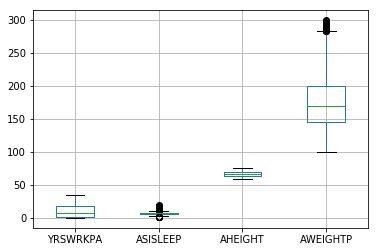

In [48]:
plt.show(health_num.boxplot(column=['YRSWRKPA',	'ASISLEEP',	'AHEIGHT','AWEIGHTP']))

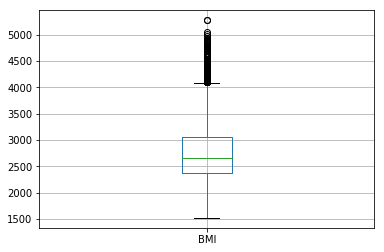

In [49]:
plt.show(health_num.boxplot(column=['BMI']))

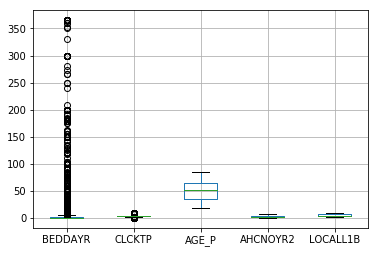

In [50]:
plt.show(health_num.boxplot(column=['BEDDAYR',	'CLCKTP',	'AGE_P',	'AHCNOYR2',	'LOCALL1B']))

In [51]:
# # z-score standard
# zscore = lambda x: ((x - x.mean()) / x.std()) if (x.dtypes==np.float64 or x.dtypes==np.int64) else x
# health_num_std = health_num.copy()
# health_num_std.apply(zscore).head()



In [52]:
#min max normalization of numerical variables
x = health_num.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
health_num_norm = pd.DataFrame(x_scaled, columns=health_num.columns)
health_num_norm.head()



,YRSWRKPA,ASISLEEP,AHEIGHT,AWEIGHTP,BMI,BEDDAYR,CLCKTP,AGE_P,AHCNOYR2,LOCALL1B
0,0.800000,0.368421,0.117647,0.276382,0.375267,0.000000,0.444444,0.701493,0.250,0.500
1,0.371429,0.210526,0.588235,0.703518,0.538913,0.010959,0.333333,0.402985,0.000,0.875
2,0.371429,0.368421,0.176471,0.683417,0.743870,0.016438,0.111111,0.731343,0.375,0.625
3,0.457143,0.368421,0.235294,0.412060,0.454424,0.000000,0.333333,0.328358,0.250,1.000
4,0.628571,0.315789,0.176471,0.175879,0.251866,0.000000,0.333333,0.910448,0.250,0.250


In [53]:
health_num_norm['LOCALL1B'].shape

(15913L,)

In [54]:
#check number of NAs
health_num_norm.isnull().sum()

YRSWRKPA    0
ASISLEEP    0
AHEIGHT     0
AWEIGHTP    0
BMI         0
BEDDAYR     0
CLCKTP      0
AGE_P       0
AHCNOYR2    0
LOCALL1B    0
dtype: int64

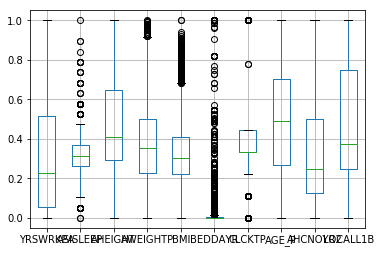

In [55]:
plt.show(health_num_norm.boxplot(column=['YRSWRKPA',	'ASISLEEP',	'AHEIGHT',	'AWEIGHTP',	'BMI',	'BEDDAYR',	'CLCKTP',	'AGE_P',	'AHCNOYR2',	'LOCALL1B']))

In [56]:
#check for correlatin between numerical variables
health_num_norm.corr()

,YRSWRKPA,ASISLEEP,AHEIGHT,AWEIGHTP,BMI,BEDDAYR,CLCKTP,AGE_P,AHCNOYR2,LOCALL1B
YRSWRKPA,1.000000,0.073681,0.029057,0.032787,0.018463,-0.000990,-0.034424,0.611988,0.064160,0.077594
ASISLEEP,0.073681,1.000000,-0.002255,-0.048063,-0.052960,-0.014005,-0.014601,0.107165,-0.010235,-0.036978
AHEIGHT,0.029057,-0.002255,1.000000,0.508214,-0.029413,-0.041522,-0.007406,-0.088707,-0.104406,0.018310
AWEIGHTP,0.032787,-0.048063,0.508214,1.000000,0.840354,-0.008086,-0.034245,-0.022113,-0.015722,0.026511
BMI,0.018463,-0.052960,-0.029413,0.840354,1.000000,0.018737,-0.033768,0.026152,0.046096,0.021117
BEDDAYR,-0.000990,-0.014005,-0.041522,-0.008086,0.018737,1.000000,0.005201,0.038757,0.203062,-0.017649
CLCKTP,-0.034424,-0.014601,-0.007406,-0.034245,-0.033768,0.005201,1.000000,-0.040367,-0.058527,-0.008623
AGE_P,0.611988,0.107165,-0.088707,-0.022113,0.026152,0.038757,-0.040367,1.000000,0.149908,0.014379
AHCNOYR2,0.064160,-0.010235,-0.104406,-0.015722,0.046096,0.203062,-0.058527,0.149908,1.000000,0.013778
LOCALL1B,0.077594,-0.036978,0.018310,0.026511,0.021117,-0.017649,-0.008623,0.014379,0.013778,1.000000


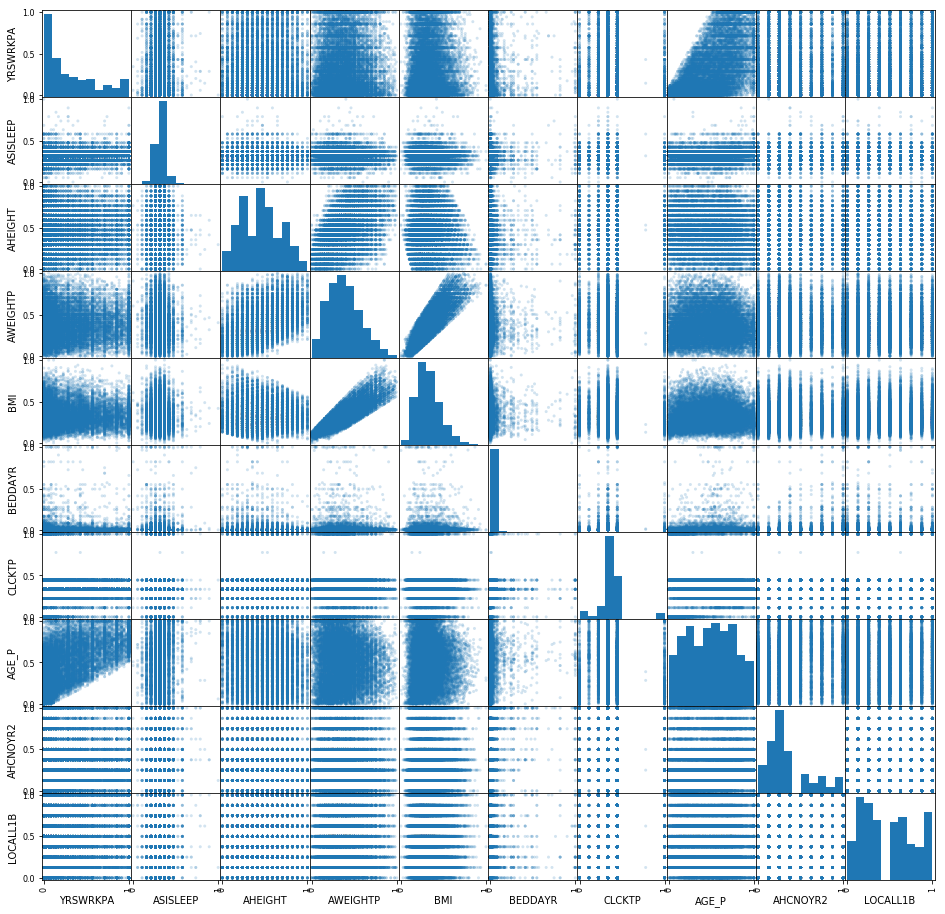

In [57]:
pd.plotting.scatter_matrix(health_num_norm, figsize=(16, 16), alpha = 0.2)
plt.show()

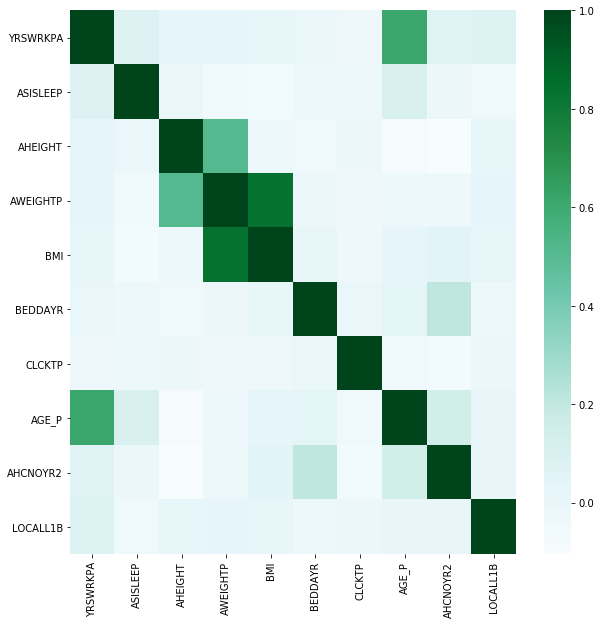

In [58]:
plt.figure(figsize=(10,10))
sns.heatmap(health_num_norm.corr(), cmap='BuGn')

In [59]:
#avr weight and avr height are higly correlated
#age and age on the job is correlated
#drop avr weight and age
health_num_norm_drop = health_num_norm.drop("AWEIGHTP",axis=1)


In [60]:
health_num_norm_drop['LOCALL1B'].shape

(15913L,)

In [61]:
#check number of NAs
health_num_norm_drop.isnull().sum().sum()

0

In [62]:
#drop age
health_num_norm_drop = health_num_norm_drop.drop("AGE_P",axis=1)

In [63]:
#check number of NAs
health_num_norm_drop.isnull().sum().sum()

0

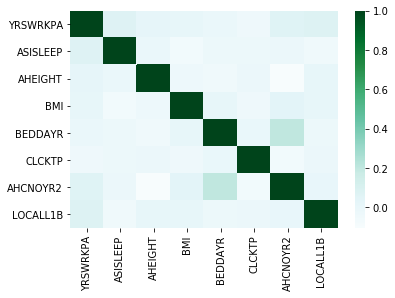

In [64]:
#Plot correlation
sns.heatmap(health_num_norm_drop.corr(), cmap='BuGn')

In [65]:
#re-run correlations
health_num_norm_drop.corr()

,YRSWRKPA,ASISLEEP,AHEIGHT,BMI,BEDDAYR,CLCKTP,AHCNOYR2,LOCALL1B
YRSWRKPA,1.000000,0.073681,0.029057,0.018463,-0.000990,-0.034424,0.064160,0.077594
ASISLEEP,0.073681,1.000000,-0.002255,-0.052960,-0.014005,-0.014601,-0.010235,-0.036978
AHEIGHT,0.029057,-0.002255,1.000000,-0.029413,-0.041522,-0.007406,-0.104406,0.018310
BMI,0.018463,-0.052960,-0.029413,1.000000,0.018737,-0.033768,0.046096,0.021117
BEDDAYR,-0.000990,-0.014005,-0.041522,0.018737,1.000000,0.005201,0.203062,-0.017649
CLCKTP,-0.034424,-0.014601,-0.007406,-0.033768,0.005201,1.000000,-0.058527,-0.008623
AHCNOYR2,0.064160,-0.010235,-0.104406,0.046096,0.203062,-0.058527,1.000000,0.013778
LOCALL1B,0.077594,-0.036978,0.018310,0.021117,-0.017649,-0.008623,0.013778,1.000000


In [66]:
#save health_num_norm_drop to csv file
health_num_norm_drop.to_csv('health_num_norm_drop.csv', sep=",")

In [67]:
health_num_norm_drop.shape

(15913, 8)

In [68]:
#force conversion to categorical varibles
health_cat = health_cat.astype('category')


In [69]:
print(health_cat.dtypes.to_string())

SEX         category
R_MARITL    category
MRACRPI2    category
REGION      category
PAR_STAT    category
DOINGLWA    category
SUPERVIS    category
WRKCATA     category
HOURPDA     category
PDSICKA     category
WRKLYR4     category
HYPEV       category
HYBPLEV     category
CHLEV       category
CHDEV       category
MIEV        category
STREV       category
COPDEV      category
AASMEV      category
ULCEV       category
CANEV       category
DBHVPAY     category
DBHVCLY     category
DBHVWLY     category
DBHVPAN     category
DBHVCLN     category
DBHVWLN     category
DIBREL      category
DIBEV1      category
DIBPRE2     category
EPILEP1     category
AHAYFYR     category
SINYR       category
CBRCHYR     category
KIDWKYR     category
LIVYR       category
JNTSYMP     category
ARTH1       category
PAINECK     category
PAINLB      category
PAINFACE    category
AMIGR       category
ACOLD2W     category
AINTIL2W    category
AHEARST1    category
AVISION     category
VIM_GLEV    category
VIM_MDEV    c

In [70]:
health_cat['ALCSTAT'].shape

(15913,)

In [71]:
health_dummy = pd.get_dummies(health_cat,drop_first=True)
health_dummy.reset_index(drop=True, inplace=True)
health_dummy.head()

,SEX_2,R_MARITL_2,R_MARITL_3,R_MARITL_4,MRACRPI2_2,MRACRPI2_3,MRACRPI2_4,REGION_2,REGION_3,REGION_4,...,AWEBUSE_2.0,YTQU_YG1_2.0,ALCSTAT_2,ALCSTAT_3,ALCSTAT_5,ALCSTAT_6,ALCSTAT_7,ALCSTAT_8,ALCSTAT_9,ALCSTAT_10
0,1,1,0,0,0,0,0,0,1,0,...,0,1,0,0,0,1,0,0,0,0
1,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,1,0,0,0,0
2,1,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
4,1,0,1,0,0,0,0,1,0,0,...,0,1,0,0,0,1,0,0,0,0


In [72]:
health_dummy['ALCSTAT_10'].shape

(15913L,)

In [73]:
#check number of NAs
health_dummy.isnull().sum().sum()

0

In [74]:
columnNamesDummy = list(health_dummy.head(0))
print(columnNamesDummy)

['SEX_2', 'R_MARITL_2', 'R_MARITL_3', 'R_MARITL_4', 'MRACRPI2_2', 'MRACRPI2_3', 'MRACRPI2_4', 'REGION_2', 'REGION_3', 'REGION_4', 'PAR_STAT_2', 'PAR_STAT_3', 'DOINGLWA_2.0', 'DOINGLWA_3.0', 'DOINGLWA_4.0', 'DOINGLWA_5.0', 'SUPERVIS_2.0', 'WRKCATA_2.0', 'WRKCATA_3.0', 'WRKCATA_4.0', 'WRKCATA_5.0', 'WRKCATA_6.0', 'HOURPDA_2.0', 'PDSICKA_2.0', 'WRKLYR4_1.0', 'WRKLYR4_2.0', 'HYPEV_2.0', 'HYBPLEV_2.0', 'HYBPLEV_3.0', 'HYBPLEV_4.0', 'HYBPLEV_5.0', 'CHLEV_2.0', 'CHDEV_2.0', 'MIEV_2.0', 'STREV_2.0', 'COPDEV_2.0', 'AASMEV_2.0', 'ULCEV_2.0', 'CANEV_2.0', 'DBHVPAY_2.0', 'DBHVCLY_2.0', 'DBHVWLY_2.0', 'DBHVPAN_2.0', 'DBHVCLN_2.0', 'DBHVWLN_2.0', 'DIBREL_2.0', 'DIBEV1_3.0', 'DIBPRE2_2.0', 'EPILEP1_2.0', 'AHAYFYR_2.0', 'SINYR_2.0', 'CBRCHYR_2.0', 'KIDWKYR_2.0', 'LIVYR_2.0', 'JNTSYMP_2.0', 'ARTH1_2.0', 'PAINECK_2.0', 'PAINLB_2.0', 'PAINFACE_2.0', 'AMIGR_2.0', 'ACOLD2W_2.0', 'AINTIL2W_2.0', 'AHEARST1_2.0', 'AHEARST1_3.0', 'AHEARST1_4.0', 'AHEARST1_5.0', 'AHEARST1_6.0', 'AVISION_2.0', 'VIM_GLEV_2.0', 'V

In [75]:
#save dummy variables to csv file
health_dummy.to_csv('health_dummy.csv', sep=",")

In [76]:
health_dummy.shape

(15913, 135)

In [77]:
health_num.shape

(15913, 10)

In [78]:
health_num.isnull().sum().sum()

0

In [79]:
#reset index for health_num
health_num.reset_index(drop=True, inplace=True)

In [80]:
#merge categorical dummy with numerical non-normalized
health_cleaned=pd.concat([health_dummy,health_num],axis=1,join_axes=[health_dummy.index])
health_cleaned.tail()



,SEX_2,R_MARITL_2,R_MARITL_3,R_MARITL_4,MRACRPI2_2,MRACRPI2_3,MRACRPI2_4,REGION_2,REGION_3,REGION_4,...,YRSWRKPA,ASISLEEP,AHEIGHT,AWEIGHTP,BMI,BEDDAYR,CLCKTP,AGE_P,AHCNOYR2,LOCALL1B
15908,1,1,0,0,0,0,0,0,0,0,...,30.0,7.0,63.0,112.0,1984.0,30.0,3,78,8.0,4.0
15909,1,0,0,0,0,0,0,0,0,1,...,1.0,8.0,66.0,127.0,2051.0,0.0,3,80,4.0,3.0
15910,1,1,0,0,0,0,0,0,1,0,...,2.0,8.0,67.0,230.0,3601.0,1.0,3,70,2.0,4.0
15911,1,0,0,0,1,0,0,0,1,0,...,18.0,7.0,64.0,220.0,3775.0,0.0,3,66,3.0,3.0
15912,1,0,0,0,0,0,0,0,1,0,...,6.0,8.0,66.0,115.0,1858.0,2.0,4,69,4.0,6.0


In [81]:
# #merge categorical dummy with numerical normalized
# health_cleaned=pd.concat([health_dummy,health_num_norm_drop],axis=1,join_axes=[health_dummy.index])
# health_cleaned.tail()

In [82]:
health_cleaned['LOCALL1B'].shape

(15913L,)

In [83]:
health_cleaned['SEX_2'].shape

(15913L,)

In [84]:
health_cleaned.shape

(15913, 145)

In [85]:
#save health cleaned to csv file
health_cleaned.to_csv('health_cleaned.csv', sep=",")

In [86]:
#Y ->'DBHVPAY_2.0' =  Told to increase physical activity, past 12 m

In [87]:
#create  dataframe
health_cl = health_cleaned[['DBHVPAY_2.0',	'SEX_2',	'R_MARITL_2',	'R_MARITL_3',	'R_MARITL_4',	'MRACRPI2_2',	'MRACRPI2_3',	'MRACRPI2_4',	'REGION_2',	'REGION_3',	'REGION_4',	'PAR_STAT_2',	'PAR_STAT_3',	'DOINGLWA_2.0',	'DOINGLWA_3.0',	'DOINGLWA_4.0',	'DOINGLWA_5.0',	'SUPERVIS_2.0',	'WRKCATA_2.0',	'WRKCATA_3.0',	'WRKCATA_4.0',	'WRKCATA_5.0',	'WRKCATA_6.0',	'HOURPDA_2.0',	'PDSICKA_2.0',	'WRKLYR4_1.0',	'WRKLYR4_2.0',	'HYPEV_2.0',	'HYBPLEV_2.0',	'HYBPLEV_3.0',	'HYBPLEV_4.0',	'HYBPLEV_5.0',	'CHLEV_2.0',	'CHDEV_2.0',	'MIEV_2.0',	'STREV_2.0',	'COPDEV_2.0',	'AASMEV_2.0',	'ULCEV_2.0',	'CANEV_2.0',	'DBHVCLY_2.0',	'DBHVWLY_2.0',	'DBHVPAN_2.0',	'DBHVCLN_2.0',	'DBHVWLN_2.0',	'DIBREL_2.0',	'DIBEV1_3.0',	'DIBPRE2_2.0',	'EPILEP1_2.0',	'AHAYFYR_2.0',	'SINYR_2.0',	'CBRCHYR_2.0',	'KIDWKYR_2.0',	'LIVYR_2.0',	'JNTSYMP_2.0',	'ARTH1_2.0',	'PAINECK_2.0',	'PAINLB_2.0',	'PAINFACE_2.0',	'AMIGR_2.0',	'ACOLD2W_2.0',	'AINTIL2W_2.0',	'AHEARST1_2.0',	'AHEARST1_3.0',	'AHEARST1_4.0',	'AHEARST1_5.0',	'AHEARST1_6.0',	'AVISION_2.0',	'VIM_GLEV_2.0',	'VIM_MDEV_2.0',	'VIMGLASS_2.0',	'AVISACT_2.0',	'CHPAIN6M_2.0',	'CHPAIN6M_3.0',	'CHPAIN6M_4.0',	'AHSTATYR_2.0',	'AHSTATYR_3.0',	'FLA1AR_2',	'FLA1AR_3',	'SPECEQ_2.0',	'ALC1YR_2.0',	'CIGAREV2_2.0',	'ECIGEV2_2.0',	'SMKSTAT2_2.0',	'SMKSTAT2_3.0',	'SMKSTAT2_4.0',	'APLKIND_2.0',	'APLKIND_3.0',	'APLKIND_4.0',	'APLKIND_5.0',	'APLKIND_6.0',	'AWORPAY_2.0',	'AWORPAY_3.0',	'ADNLONG2_1.0',	'ADNLONG2_2.0',	'ADNLONG2_3.0',	'ADNLONG2_4.0',	'ADNLONG2_5.0',	'ASRGYR_2.0',	'AMDLONGR_1.0',	'AMDLONGR_2.0',	'AMDLONGR_3.0',	'AMDLONGR_4.0',	'AMDLONGR_5.0',	'HIT1A_2.0',	'HIT2A_2.0',	'HIT3A_2.0',	'HIT4A_2.0',	'FLUVACYR_2.0',	'LIVEV_2.0',	'ASICPUSE_2.0',	'ASICPUSE_3.0',	'ASICPUSE_4.0',	'ASIRETR_2.0',	'ASIRETR_3.0',	'ASIRETR_4.0',	'ASIMEDC_2.0',	'ASIMEDC_3.0',	'ASIMEDC_4.0',	'ASISTLV_2.0',	'ASISTLV_3.0',	'ASISTLV_4.0',	'ASICNHC_2.0',	'ASICNHC_3.0',	'ASICNHC_4.0',	'AWEBUSE_2.0',	'YTQU_YG1_2.0',	'ALCSTAT_2',	'ALCSTAT_3',	'ALCSTAT_5',	'ALCSTAT_6',	'ALCSTAT_7',	'ALCSTAT_8',	'ALCSTAT_9',	'ALCSTAT_10',	'YRSWRKPA',	'ASISLEEP',	'AHEIGHT',	'BMI',	'BEDDAYR',	'CLCKTP',	'AHCNOYR2',	'LOCALL1B']]
health_cl['DBHVPAY_2.0'].head()

0    0
1    1
2    0
3    1
4    1
Name: DBHVPAY_2.0, dtype: uint8

In [88]:
#recode 'DBHVPAY_2.0' so 1 means Yes
physical = pd.get_dummies(health_cl['DBHVPAY_2.0'])
physical.columns = ["phys_yes", "phys_no"]
physical = physical.drop(columns=['phys_no'])
physical.head()


,phys_yes
0,1
1,0
2,1
3,0
4,0


In [89]:
#repalce 'phys_yes' with 'DBHVPAY_YES'
health_tree=pd.concat([physical,health_cl],axis=1,join_axes=[physical.index])
health_tree = health_tree.drop(columns=['DBHVPAY_2.0'])
health_tree.columns.values[0] = "DBHVPAY_YES"
health_tree.head()

,DBHVPAY_YES,SEX_2,R_MARITL_2,R_MARITL_3,R_MARITL_4,MRACRPI2_2,MRACRPI2_3,MRACRPI2_4,REGION_2,REGION_3,...,ALCSTAT_9,ALCSTAT_10,YRSWRKPA,ASISLEEP,AHEIGHT,BMI,BEDDAYR,CLCKTP,AHCNOYR2,LOCALL1B
0,1,1,1,0,0,0,0,0,0,1,...,0,0,28.0,8.0,61.0,2930.0,0.0,4,2.0,5.0
1,0,0,0,0,0,0,0,0,1,0,...,0,0,13.0,5.0,69.0,3544.0,4.0,3,0.0,8.0
2,1,1,0,1,0,0,0,0,1,0,...,0,0,13.0,8.0,62.0,4313.0,6.0,1,3.0,6.0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,16.0,8.0,63.0,3227.0,0.0,3,2.0,9.0
4,0,1,0,1,0,0,0,0,1,0,...,0,0,22.0,7.0,62.0,2467.0,0.0,3,2.0,3.0


In [90]:
health_tree_drop = health_tree

In [91]:
#column names
health_names = health_tree_drop.columns.values
health_names

array(['DBHVPAY_YES', 'SEX_2', 'R_MARITL_2', 'R_MARITL_3', 'R_MARITL_4',
       'MRACRPI2_2', 'MRACRPI2_3', 'MRACRPI2_4', 'REGION_2', 'REGION_3',
       'REGION_4', 'PAR_STAT_2', 'PAR_STAT_3', 'DOINGLWA_2.0',
       'DOINGLWA_3.0', 'DOINGLWA_4.0', 'DOINGLWA_5.0', 'SUPERVIS_2.0',
       'WRKCATA_2.0', 'WRKCATA_3.0', 'WRKCATA_4.0', 'WRKCATA_5.0',
       'WRKCATA_6.0', 'HOURPDA_2.0', 'PDSICKA_2.0', 'WRKLYR4_1.0',
       'WRKLYR4_2.0', 'HYPEV_2.0', 'HYBPLEV_2.0', 'HYBPLEV_3.0',
       'HYBPLEV_4.0', 'HYBPLEV_5.0', 'CHLEV_2.0', 'CHDEV_2.0', 'MIEV_2.0',
       'STREV_2.0', 'COPDEV_2.0', 'AASMEV_2.0', 'ULCEV_2.0', 'CANEV_2.0',
       'DBHVCLY_2.0', 'DBHVWLY_2.0', 'DBHVPAN_2.0', 'DBHVCLN_2.0',
       'DBHVWLN_2.0', 'DIBREL_2.0', 'DIBEV1_3.0', 'DIBPRE2_2.0',
       'EPILEP1_2.0', 'AHAYFYR_2.0', 'SINYR_2.0', 'CBRCHYR_2.0',
       'KIDWKYR_2.0', 'LIVYR_2.0', 'JNTSYMP_2.0', 'ARTH1_2.0',
       'PAINECK_2.0', 'PAINLB_2.0', 'PAINFACE_2.0', 'AMIGR_2.0',
       'ACOLD2W_2.0', 'AINTIL2W_2.0', 'AHEARST1

In [92]:
y = health_tree_drop['DBHVPAY_YES'] # y variable
X = health_tree_drop[health_names[1:]]
X.head()

,SEX_2,R_MARITL_2,R_MARITL_3,R_MARITL_4,MRACRPI2_2,MRACRPI2_3,MRACRPI2_4,REGION_2,REGION_3,REGION_4,...,ALCSTAT_9,ALCSTAT_10,YRSWRKPA,ASISLEEP,AHEIGHT,BMI,BEDDAYR,CLCKTP,AHCNOYR2,LOCALL1B
0,1,1,0,0,0,0,0,0,1,0,...,0,0,28.0,8.0,61.0,2930.0,0.0,4,2.0,5.0
1,0,0,0,0,0,0,0,1,0,0,...,0,0,13.0,5.0,69.0,3544.0,4.0,3,0.0,8.0
2,1,0,1,0,0,0,0,1,0,0,...,0,0,13.0,8.0,62.0,4313.0,6.0,1,3.0,6.0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,16.0,8.0,63.0,3227.0,0.0,3,2.0,9.0
4,1,0,1,0,0,0,0,1,0,0,...,0,0,22.0,7.0,62.0,2467.0,0.0,3,2.0,3.0


In [93]:
y.head

<bound method Series.head of 0        1
1        0
2        1
3        0
4        0
5        0
6        0
7        1
8        1
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       1
19       1
20       1
21       0
22       1
23       0
24       1
25       1
26       0
27       0
28       0
29       0
        ..
15883    0
15884    0
15885    0
15886    1
15887    1
15888    0
15889    0
15890    0
15891    0
15892    0
15893    1
15894    0
15895    0
15896    0
15897    1
15898    1
15899    0
15900    1
15901    0
15902    0
15903    1
15904    1
15905    0
15906    0
15907    0
15908    0
15909    0
15910    1
15911    1
15912    0
Name: DBHVPAY_YES, Length: 15913, dtype: uint8>

In [94]:
#create train and test sets
from sklearn.cross_validation import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=99874)
print "X_train", X_train.shape
print "y_train", y_train.shape
print "X_test", X_test.shape
print "y_test", y_test.shape

X_train (12730, 142)
y_train (12730L,)
X_test (3183, 142)
y_test (3183L,)


In [95]:
############################################################################################

#Decistion Tree

############################################################################################

In [96]:
treeclf = tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=3)
treeclf = treeclf.fit(X_train, y_train)

In [97]:
#A versatile function to measure performance of a classification model
from sklearn import metrics

def measure_performance(X, y, clf, show_accuracy=True, show_classification_report=True, show_confussion_matrix=True):
    y_pred = clf.predict(X)   
    if show_accuracy:
         print "Accuracy:{0:.3f}".format(metrics.accuracy_score(y, y_pred)),"\n"
    if show_classification_report:
        print "Classification report"
        print metrics.classification_report(y, y_pred),"\n"
      
    if show_confussion_matrix:
        print "Confussion matrix"
        print metrics.confusion_matrix(y, y_pred),"\n"

In [98]:
measure_performance(X_test, y_test, treeclf, show_confussion_matrix=True, show_classification_report=True)

Accuracy:0.712 

Classification report
             precision    recall  f1-score   support

          0       0.79      0.78      0.78      2140
          1       0.56      0.57      0.56      1043

avg / total       0.71      0.71      0.71      3183


Confussion matrix
[[1670  470]
 [ 448  595]] 



In [99]:
#predictions
treepreds_test = treeclf.predict(X_test)
print treepreds_test

[0 1 0 ... 0 0 1]


In [100]:
#classification report
print(classification_report(y_test, treepreds_test))

             precision    recall  f1-score   support

          0       0.79      0.78      0.78      2140
          1       0.56      0.57      0.56      1043

avg / total       0.71      0.71      0.71      3183



In [101]:
treecm = confusion_matrix(y_test, treepreds_test)
print treecm

[[1670  470]
 [ 448  595]]


In [102]:
print treeclf.score(X_test, y_test)
print treeclf.score(X_train, y_train)

0.7115928369462771
0.9979575805184603


In [103]:
export_graphviz(treeclf,out_file='tree.dot', feature_names=X_train.columns, class_names=["No","Yes"])

with open("tree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

In [104]:
system(dot -Tpng tree.dot -o dtree.png)

['dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.447679 to fit']

In [105]:
from IPython.display import Image
Image(filename='dtree.png', width=800)

In [106]:
########################################################################################

#Feature Selection


########################################################################################

In [107]:
#Select the top 30% of the most important features, using a chi2 test
fs = feature_selection.SelectPercentile(feature_selection.chi2, percentile=30)
X_train_fs = fs.fit_transform(X_train, y_train)

In [108]:
np.set_printoptions(suppress=True, precision=2, linewidth=320)
print fs.get_support()
print fs.scores_

[False False False  True False False False False False False False False False False False  True False False False False False False False  True False  True  True  True False False False  True False False False False False False False  True  True  True  True False  True  True  True False False False False False False
  True  True False  True False False False False False False  True False False False False False  True False False  True  True  True False  True False False False False False False  True False False False False False False False False False False False False False False  True  True  True  True  True  True False False
 False  True False False False False  True False  True  True False  True  True False  True  True False  True False False False False False False False False False False  True False False  True  True False  True False]
[    10.72      1.68      9.72     42.97     20.42      0.02      7.79      9.57     12.92      0.1       0.05      8.28      1.46      0.07    

In [109]:
X.columns.values

array(['SEX_2', 'R_MARITL_2', 'R_MARITL_3', 'R_MARITL_4', 'MRACRPI2_2', 'MRACRPI2_3', 'MRACRPI2_4', 'REGION_2', 'REGION_3', 'REGION_4', 'PAR_STAT_2', 'PAR_STAT_3', 'DOINGLWA_2.0', 'DOINGLWA_3.0', 'DOINGLWA_4.0', 'DOINGLWA_5.0', 'SUPERVIS_2.0', 'WRKCATA_2.0', 'WRKCATA_3.0', 'WRKCATA_4.0', 'WRKCATA_5.0', 'WRKCATA_6.0',
       'HOURPDA_2.0', 'PDSICKA_2.0', 'WRKLYR4_1.0', 'WRKLYR4_2.0', 'HYPEV_2.0', 'HYBPLEV_2.0', 'HYBPLEV_3.0', 'HYBPLEV_4.0', 'HYBPLEV_5.0', 'CHLEV_2.0', 'CHDEV_2.0', 'MIEV_2.0', 'STREV_2.0', 'COPDEV_2.0', 'AASMEV_2.0', 'ULCEV_2.0', 'CANEV_2.0', 'DBHVCLY_2.0', 'DBHVWLY_2.0', 'DBHVPAN_2.0', 'DBHVCLN_2.0', 'DBHVWLN_2.0',
       'DIBREL_2.0', 'DIBEV1_3.0', 'DIBPRE2_2.0', 'EPILEP1_2.0', 'AHAYFYR_2.0', 'SINYR_2.0', 'CBRCHYR_2.0', 'KIDWKYR_2.0', 'LIVYR_2.0', 'JNTSYMP_2.0', 'ARTH1_2.0', 'PAINECK_2.0', 'PAINLB_2.0', 'PAINFACE_2.0', 'AMIGR_2.0', 'ACOLD2W_2.0', 'AINTIL2W_2.0', 'AHEARST1_2.0', 'AHEARST1_3.0', 'AHEARST1_4.0', 'AHEARST1_5.0',
       'AHEARST1_6.0', 'AVISION_2.0', 'VIM_G

In [110]:
col_fs = X.columns[fs.get_support()].values
print X.columns[fs.get_support()].values

['R_MARITL_4' 'DOINGLWA_5.0' 'PDSICKA_2.0' 'WRKLYR4_2.0' 'HYPEV_2.0' 'HYBPLEV_2.0' 'CHLEV_2.0' 'DBHVCLY_2.0' 'DBHVWLY_2.0' 'DBHVPAN_2.0' 'DBHVCLN_2.0' 'DIBREL_2.0' 'DIBEV1_3.0' 'DIBPRE2_2.0' 'JNTSYMP_2.0' 'ARTH1_2.0' 'PAINLB_2.0' 'AHEARST1_4.0' 'VIMGLASS_2.0' 'CHPAIN6M_3.0' 'CHPAIN6M_4.0' 'AHSTATYR_2.0' 'FLA1AR_2'
 'SMKSTAT2_3.0' 'AMDLONGR_1.0' 'AMDLONGR_2.0' 'AMDLONGR_3.0' 'AMDLONGR_4.0' 'AMDLONGR_5.0' 'HIT1A_2.0' 'FLUVACYR_2.0' 'ASIRETR_2.0' 'ASIRETR_4.0' 'ASIMEDC_2.0' 'ASIMEDC_4.0' 'ASISTLV_2.0' 'ASISTLV_4.0' 'ASICNHC_2.0' 'ASICNHC_4.0' 'YRSWRKPA' 'BMI' 'BEDDAYR' 'AHCNOYR2']


In [111]:
for i in range(len(X.columns.values)):
    if fs.get_support()[i]:
        print X.columns.values[i],'\t', fs.scores_[i] 

R_MARITL_4 	42.97152965573381
DOINGLWA_5.0 	24.440677734009945
PDSICKA_2.0 	27.10800102976878
WRKLYR4_2.0 	37.76499086934696
HYPEV_2.0 	174.81754238183038
HYBPLEV_2.0 	133.3646814616467
CHLEV_2.0 	156.37477740755534
DBHVCLY_2.0 	948.91334245696
DBHVWLY_2.0 	80.20430711762559
DBHVPAN_2.0 	233.9509717959108
DBHVCLN_2.0 	260.4055529331171
DIBREL_2.0 	52.58443908027876
DIBEV1_3.0 	164.75186542982306
DIBPRE2_2.0 	40.411086027522884
JNTSYMP_2.0 	104.42454178999881
ARTH1_2.0 	83.6062555320664
PAINLB_2.0 	55.630962083655746
AHEARST1_4.0 	27.81375394162351
VIMGLASS_2.0 	98.653988185113
CHPAIN6M_3.0 	41.46666230317362
CHPAIN6M_4.0 	113.34459081440757
AHSTATYR_2.0 	48.25193656407255
FLA1AR_2 	180.22167830918744
SMKSTAT2_3.0 	21.71492487041027
AMDLONGR_1.0 	66.3231659504418
AMDLONGR_2.0 	38.10360226780435
AMDLONGR_3.0 	131.32662236622852
AMDLONGR_4.0 	89.3167521015692
AMDLONGR_5.0 	25.547233725732838
HIT1A_2.0 	27.68184610025459
FLUVACYR_2.0 	40.24264705761122
ASIRETR_2.0 	21.052242302414538
ASIRE

In [112]:
print X_train_fs

[[   0.    0.    0. ... 3662.    0.    1.]
 [   0.    0.    0. ... 2711.    0.    3.]
 [   0.    1.    1. ... 3070.    0.    1.]
 ...
 [   1.    1.    0. ... 2206.    1.    1.]
 [   1.    0.    0. ... 1892.    5.    3.]
 [   0.    0.    0. ... 2510.    0.    1.]]


In [113]:
dt = tree.DecisionTreeClassifier(criterion='entropy')
dt.fit(X_train_fs, y_train)
X_test_fs = fs.transform(X_test)
measure_performance(X_test_fs, y_test, dt, show_confussion_matrix=False, show_classification_report=True)

Accuracy:0.706 

Classification report
             precision    recall  f1-score   support

          0       0.79      0.77      0.78      2140
          1       0.55      0.57      0.56      1043

avg / total       0.71      0.71      0.71      3183




In [114]:
#export_graphviz(dt,out_file='tree2.dot', feature_names=X_train_fs.columns, class_names=["No","Yes"])
export_graphviz(dt,out_file='tree2.dot', feature_names=col_fs, class_names=["No","Yes"])

with open("tree2.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

In [115]:
system(dot -Tpng tree2.dot -o dtree2.png)

['dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.319404 to fit']

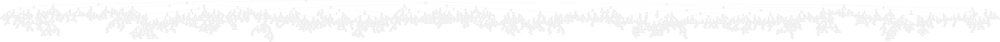

In [116]:
from IPython.display import Image
Image(filename='dtree2.png', width=800)

1 0.6573448546739985
6 0.7065200314218381
11 0.7055773762765122
16 0.7063629222309504
21 0.711311861743912
26 0.7100549882168108
31 0.7142969363707777
36 0.715553809897879
41 0.7186174391201885
46 0.7135899450117832
51 0.7144540455616653
56 0.711783189316575
61 0.7150039277297722
66 0.7124901806755695
71 0.7142183817753338
76 0.7171249018067557
81 0.712725844461901
86 0.7088766692851532
91 0.7124116260801256
96 0.7117046347211312
Optimal percentile of features is:  41
Optimal number of features is:  58


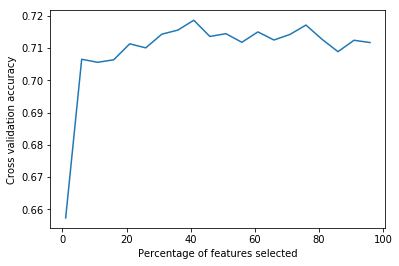

In [117]:
#Find the best percentile for feature selection using cross-validation
from sklearn import cross_validation
dt = tree.DecisionTreeClassifier(criterion='entropy')

percentiles = range(1, 100, 5)
results = []
for i in range(1, 100, 5):
    fs = feature_selection.SelectPercentile(feature_selection.chi2, percentile=i)
    X_train_fs = fs.fit_transform(X_train, y_train)
    scores = cross_validation.cross_val_score(dt, X_train_fs, y_train, cv=5)
    print i,scores.mean()
    results = np.append(results, scores.mean())

# optimal_percentile = np.where(results == results.max())[0]
# print "Optimal percentile of features:{0}".format(percentiles[optimal_percentile]), "\n"
# optimal_num_features = int(percentiles[optimal_percentile]*len(X.columns)/100)
# print "Optimal number of features:{0}".format(optimal_num_features), "\n"

optimal_percentil = int(np.where(results == results.max())[0])
print "Optimal percentile of features is: ", percentiles[optimal_percentil]

#optimal_num_features = percentiles[optimal_percentile]*len(X.columns)/100
#optimal_num_features = int(math.floor(percentiles[optimal_percentil]*X.shape[1]/100))
optimal_num_features = int((percentiles[optimal_percentil]*X.shape[1]/100))
print "Optimal number of features is: ", optimal_num_features



# Plot percentile of features VS. cross-validation scores
import pylab as pl
pl.figure()
pl.xlabel("Percentage of features selected")
pl.ylabel("Cross validation accuracy")
pl.plot(percentiles,results)

In [118]:
#Impact of max-depth

In [119]:
from sklearn.cross_validation import KFold

def calc_params(X, y, clf, param_values, param_name, K):
    
    # Convert input to Numpy arrays
    X = np.array(X)
    y = np.array(y)

    # initialize training and testing scores with zeros
    train_scores = np.zeros(len(param_values))
    test_scores = np.zeros(len(param_values))
    
    # iterate over the different parameter values
    for i, param_value in enumerate(param_values):
        print param_name, ' = ', param_value
        
        # set classifier parameters
        clf.set_params(**{param_name:param_value})
        
        # initialize the K scores obtained for each fold
        k_train_scores = np.zeros(K)
        k_test_scores = np.zeros(K)
        
        # create KFold cross validation
        cv = KFold(len(X), K, shuffle=True, random_state=0)
        
        # iterate over the K folds
        for j, (train, test) in enumerate(cv):
            # fit the classifier in the corresponding fold
            # and obtain the corresponding accuracy scores on train and test sets
            clf.fit([X[k] for k in train], y[train])
            k_train_scores[j] = clf.score([X[k] for k in train], y[train])
            k_test_scores[j] = clf.score([X[k] for k in test], y[test])
            
        # store the mean of the K fold scores
        train_scores[i] = np.mean(k_train_scores)
        test_scores[i] = np.mean(k_test_scores)
       
    # plot the training and testing scores in a log scale
    plt.plot(param_values, train_scores, label='Train', alpha=0.4, lw=2, c='b')
    plt.plot(param_values, test_scores, label='X-Val', alpha=0.4, lw=2, c='g')
    plt.legend(loc=7)
    plt.xlabel(param_name + " values")
    plt.ylabel("Mean cross validation accuracy")

    # return the training and testing scores on each parameter value
    return train_scores, test_scores

In [120]:
# Let's create an evenly spaced range of numbers in a specified interval
md = np.linspace(1, 40, 20)
md = np.array([int(e) for e in md])
print md

[ 1  3  5  7  9 11 13 15 17 19 21 23 25 27 29 31 33 35 37 40]


max_depth  =  1
max_depth  =  3
max_depth  =  5
max_depth  =  7
max_depth  =  9
max_depth  =  11
max_depth  =  13
max_depth  =  15
max_depth  =  17
max_depth  =  19
max_depth  =  21
max_depth  =  23
max_depth  =  25
max_depth  =  27
max_depth  =  29
max_depth  =  31
max_depth  =  33
max_depth  =  35
max_depth  =  37
max_depth  =  40


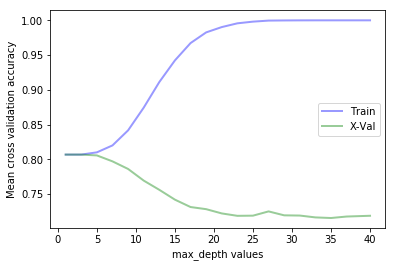

In [121]:
train_scores, test_scores = calc_params(X_train, y_train, dt, md, 'max_depth', 5)

In [122]:
#max_depth = 4 looks the best

In [123]:
#min number of samples allowed at a leaf node

min_samples_leaf  =  1
min_samples_leaf  =  3
min_samples_leaf  =  5
min_samples_leaf  =  7
min_samples_leaf  =  9
min_samples_leaf  =  11
min_samples_leaf  =  13
min_samples_leaf  =  15
min_samples_leaf  =  17
min_samples_leaf  =  19
min_samples_leaf  =  21
min_samples_leaf  =  23
min_samples_leaf  =  25
min_samples_leaf  =  27
min_samples_leaf  =  30


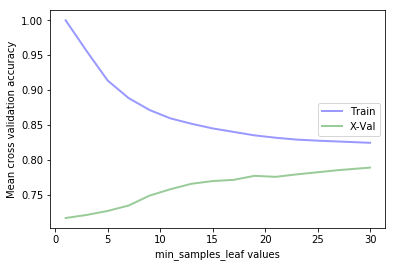

In [124]:
msl = np.linspace(1, 30, 15)
msl = np.array([int(e) for e in msl])

dt = tree.DecisionTreeClassifier(criterion='entropy')
train_scores, test_scores = calc_params(X_train, y_train, dt, msl, 'min_samples_leaf', 5)

In [125]:
#min_samples_leaf should be between 10 and 15 

In [126]:
#Grid Search allows us to more systemiatically explore different combinations of multiple parameters

In [127]:
#from sklearn.grid_search import GridSearchCV
from sklearn.model_selection import GridSearchCV


dt = tree.DecisionTreeClassifier()

# parameters = {
#     'criterion': ['entropy','gini'],
#     'max_depth': np.linspace(1, 20, 10),
#     'min_samples_leaf': np.linspace(10, 15, 5),
#     'min_samples_split': np.linspace(10, 15, 5)
# }

parameters = {
    'criterion': ['entropy','gini'],
    'max_depth': [1,2,3,4,5,6,8,10],
    'min_samples_leaf': [2,4,6,8,10,12,14,16,18,20,],
    'min_samples_split': [2,4,6,8,10,12,14,16,18,20]
}

gs = GridSearchCV(estimator=dt, param_grid=parameters, verbose=1, cv=5,refit=True, n_jobs = -1)

In [128]:

%time
gs.fit(X_train, y_train)
gs.best_params_, gs.best_score_

Wall time: 0 ns
Fitting 5 folds for each of 1600 candidates, totalling 8000 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 311 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done 811 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 1511 tasks      | elapsed:   46.4s
[Parallel(n_jobs=-1)]: Done 2411 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3511 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 4582 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 6082 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 7782 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 8000 out of 8000 | elapsed:  6.6min finished


({'criterion': 'entropy',
  'max_depth': 1,
  'min_samples_leaf': 2,
  'min_samples_split': 2},
 0.8069128043990573)

In [129]:
# Note: best parameters results change most of the time

# [Parallel(n_jobs=1)]: Done 8000 out of 8000 | elapsed:  2.9min finished

# ({'criterion': 'gini',
#   'max_depth': 5,
#   'min_samples_leaf': 20,
#   'min_samples_split': 2},
#  0.8076197957580519)

dt = tree.DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=20, min_samples_split=2)

dt.fit(X_train, y_train)
measure_performance(X_test, y_test, dt, show_confussion_matrix=False, show_classification_report=True)

Accuracy:0.801 

Classification report
             precision    recall  f1-score   support

          0       0.82      0.90      0.86      2140
          1       0.75      0.59      0.66      1043

avg / total       0.80      0.80      0.79      3183




In [130]:
from sklearn.tree import export_graphviz
export_graphviz(dt,out_file='treefinal.dot', feature_names=X_train.columns)

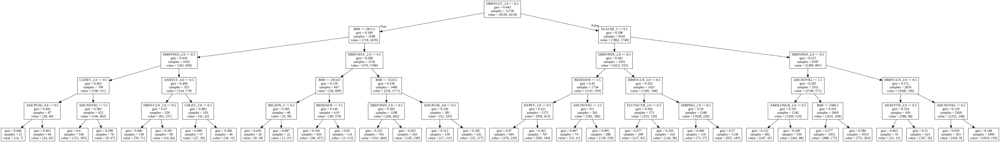

In [131]:
import graphviz

with open("treefinal.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

In [132]:
system(dot -Tpng treefinal.dot -o treefinal.png)

[]

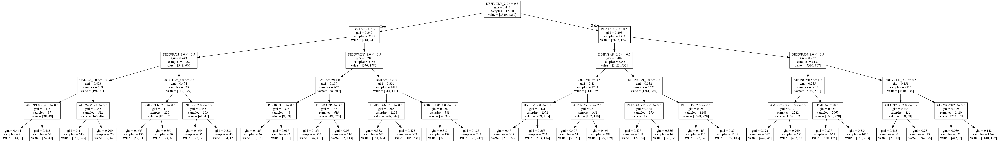

In [133]:
from IPython.display import Image
Image(filename='treefinal.png', width=800)

In [134]:
print(X_train.columns.values)

['SEX_2' 'R_MARITL_2' 'R_MARITL_3' 'R_MARITL_4' 'MRACRPI2_2' 'MRACRPI2_3' 'MRACRPI2_4' 'REGION_2' 'REGION_3' 'REGION_4' 'PAR_STAT_2' 'PAR_STAT_3' 'DOINGLWA_2.0' 'DOINGLWA_3.0' 'DOINGLWA_4.0' 'DOINGLWA_5.0' 'SUPERVIS_2.0' 'WRKCATA_2.0' 'WRKCATA_3.0' 'WRKCATA_4.0' 'WRKCATA_5.0' 'WRKCATA_6.0' 'HOURPDA_2.0' 'PDSICKA_2.0'
 'WRKLYR4_1.0' 'WRKLYR4_2.0' 'HYPEV_2.0' 'HYBPLEV_2.0' 'HYBPLEV_3.0' 'HYBPLEV_4.0' 'HYBPLEV_5.0' 'CHLEV_2.0' 'CHDEV_2.0' 'MIEV_2.0' 'STREV_2.0' 'COPDEV_2.0' 'AASMEV_2.0' 'ULCEV_2.0' 'CANEV_2.0' 'DBHVCLY_2.0' 'DBHVWLY_2.0' 'DBHVPAN_2.0' 'DBHVCLN_2.0' 'DBHVWLN_2.0' 'DIBREL_2.0' 'DIBEV1_3.0' 'DIBPRE2_2.0' 'EPILEP1_2.0'
 'AHAYFYR_2.0' 'SINYR_2.0' 'CBRCHYR_2.0' 'KIDWKYR_2.0' 'LIVYR_2.0' 'JNTSYMP_2.0' 'ARTH1_2.0' 'PAINECK_2.0' 'PAINLB_2.0' 'PAINFACE_2.0' 'AMIGR_2.0' 'ACOLD2W_2.0' 'AINTIL2W_2.0' 'AHEARST1_2.0' 'AHEARST1_3.0' 'AHEARST1_4.0' 'AHEARST1_5.0' 'AHEARST1_6.0' 'AVISION_2.0' 'VIM_GLEV_2.0' 'VIM_MDEV_2.0' 'VIMGLASS_2.0'
 'AVISACT_2.0' 'CHPAIN6M_2.0' 'CHPAIN6M_3.0' 'CHPAIN6

In [135]:
dt = tree.DecisionTreeClassifier(criterion='entropy', max_depth=4, min_samples_leaf=10, min_samples_split=2)

dt.fit(X_train, y_train)
measure_performance(X_test, y_test, dt, show_confussion_matrix=True, show_classification_report=True)

Accuracy:0.803 

Classification report
             precision    recall  f1-score   support

          0       0.81      0.92      0.86      2140
          1       0.78      0.56      0.65      1043

avg / total       0.80      0.80      0.79      3183


Confussion matrix
[[1973  167]
 [ 459  584]] 



In [136]:
dt


DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=10, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [137]:
dt.get_params

<bound method DecisionTreeClassifier.get_params of DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=10, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')>

In [138]:
from sklearn.tree import export_graphviz
export_graphviz(dt,out_file='treefinal2.dot', feature_names=X_train.columns)

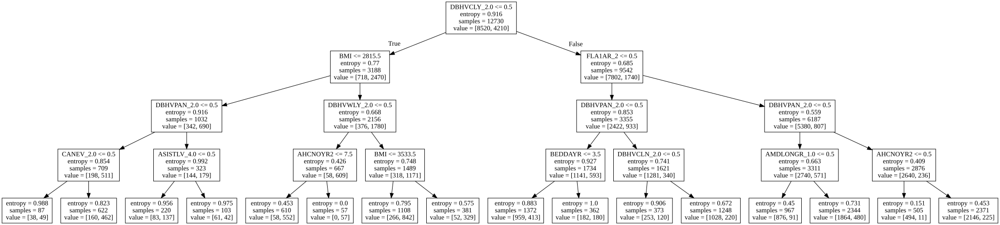

In [139]:
import graphviz

with open("treefinal2.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

In [140]:
system(dot -Tpng treefinal2.dot -o treefinal2.png)

[]

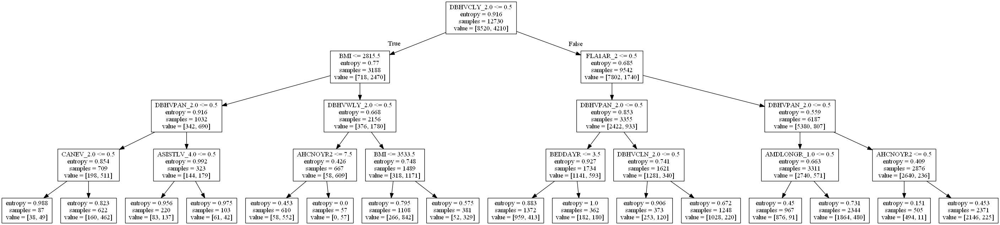

In [141]:
from IPython.display import Image
Image(filename='treefinal2.png', width=800)

In [142]:

#variables returned by decision tree
#'DBHVCLY_2.0','BMI','DBHVPAN_2.0','DBHVWLY_2.0','CANEV_2.0','ASISTLV_4.0','AHCNOYR2','BEDDAYR',
#'DBHVCLN_2.0','AMDLONGR_1.0','AHCNOYR2','FLA1AR_2'

In [143]:
#create new data frame

#health_cleaned
health_tree.tail()

,DBHVPAY_YES,SEX_2,R_MARITL_2,R_MARITL_3,R_MARITL_4,MRACRPI2_2,MRACRPI2_3,MRACRPI2_4,REGION_2,REGION_3,...,ALCSTAT_9,ALCSTAT_10,YRSWRKPA,ASISLEEP,AHEIGHT,BMI,BEDDAYR,CLCKTP,AHCNOYR2,LOCALL1B
15908,0,1,1,0,0,0,0,0,0,0,...,0,0,30.0,7.0,63.0,1984.0,30.0,3,8.0,4.0
15909,0,1,0,0,0,0,0,0,0,0,...,0,0,1.0,8.0,66.0,2051.0,0.0,3,4.0,3.0
15910,1,1,1,0,0,0,0,0,0,1,...,0,0,2.0,8.0,67.0,3601.0,1.0,3,2.0,4.0
15911,1,1,0,0,0,1,0,0,0,1,...,0,0,18.0,7.0,64.0,3775.0,0.0,3,3.0,3.0
15912,0,1,0,0,0,0,0,0,0,1,...,0,0,6.0,8.0,66.0,1858.0,2.0,4,4.0,6.0


In [144]:
health_tree= pd.DataFrame(health_tree)

In [145]:
health_tree.head(1)

,DBHVPAY_YES,SEX_2,R_MARITL_2,R_MARITL_3,R_MARITL_4,MRACRPI2_2,MRACRPI2_3,MRACRPI2_4,REGION_2,REGION_3,...,ALCSTAT_9,ALCSTAT_10,YRSWRKPA,ASISLEEP,AHEIGHT,BMI,BEDDAYR,CLCKTP,AHCNOYR2,LOCALL1B
0,1,1,1,0,0,0,0,0,0,1,...,0,0,28.0,8.0,61.0,2930.0,0.0,4,2.0,5.0


In [146]:
hn = health_tree[['DBHVPAY_YES','DBHVCLY_2.0','BMI','DBHVPAN_2.0','DBHVWLY_2.0','CANEV_2.0','ASISTLV_4.0','AHCNOYR2','BEDDAYR','DBHVCLN_2.0','AMDLONGR_1.0','AHCNOYR2','FLA1AR_2']]
hn.head()

,DBHVPAY_YES,DBHVCLY_2.0,BMI,DBHVPAN_2.0,DBHVWLY_2.0,CANEV_2.0,ASISTLV_4.0,AHCNOYR2,BEDDAYR,DBHVCLN_2.0,AMDLONGR_1.0,AHCNOYR2,FLA1AR_2
0,1,1,2930.0,0,1,1,1,2.0,0.0,0,0,2.0,1
1,0,0,3544.0,0,1,1,0,0.0,4.0,0,1,0.0,0
2,1,1,4313.0,0,1,1,1,3.0,6.0,0,1,3.0,1
3,0,1,3227.0,0,1,1,0,2.0,0.0,1,0,2.0,1
4,0,1,2467.0,0,1,1,0,2.0,0.0,0,1,2.0,1


In [147]:
y = hn['DBHVPAY_YES'] # y variable
X = hn[['DBHVCLY_2.0','BMI','DBHVPAN_2.0','DBHVWLY_2.0','CANEV_2.0','ASISTLV_4.0','AHCNOYR2','BEDDAYR','DBHVCLN_2.0','AMDLONGR_1.0','AHCNOYR2','FLA1AR_2']]
X.head()

,DBHVCLY_2.0,BMI,DBHVPAN_2.0,DBHVWLY_2.0,CANEV_2.0,ASISTLV_4.0,AHCNOYR2,AHCNOYR2,BEDDAYR,DBHVCLN_2.0,AMDLONGR_1.0,AHCNOYR2,AHCNOYR2,FLA1AR_2
0,1,2930.0,0,1,1,1,2.0,2.0,0.0,0,0,2.0,2.0,1
1,0,3544.0,0,1,1,0,0.0,0.0,4.0,0,1,0.0,0.0,0
2,1,4313.0,0,1,1,1,3.0,3.0,6.0,0,1,3.0,3.0,1
3,1,3227.0,0,1,1,0,2.0,2.0,0.0,1,0,2.0,2.0,1
4,1,2467.0,0,1,1,0,2.0,2.0,0.0,0,1,2.0,2.0,1


In [148]:
#create train and test sets
from sklearn.cross_validation import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=9874)
print "X_train", X_train.shape
print "y_train", y_train.shape
print "X_test", X_test.shape
print "y_test", y_test.shape

X_train (12730, 14)
y_train (12730L,)
X_test (3183, 14)
y_test (3183L,)


In [149]:
##############################################################################################################

#Logistic Regression

##############################################################################################################

In [150]:

from sklearn.linear_model import LogisticRegression

In [151]:
#logistic regression with recursive feature elimination using cross validation
LogReg = LogisticRegression()
refcv = RFECV(LogReg, cv = 10, step = 1, n_jobs = -1)
fitcv = refcv.fit(X_train, y_train)

In [152]:
y_pred = fitcv.predict(X_test)
y_pred

array([0, 0, 1, ..., 1, 0, 0], dtype=uint8)

In [153]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
confusion_matrix

array([[1942,  186],
       [ 419,  636]], dtype=int64)

In [154]:
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.82      0.91      0.87      2128
          1       0.77      0.60      0.68      1055

avg / total       0.81      0.81      0.80      3183



In [155]:
#np.set_printoptions(threshold=np.inf)
np.set_printoptions(threshold=1000)
print "", y_pred

 [0 0 1 ... 1 0 0]


In [156]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

('Accuracy:', 0.8099277411247251)
('Precision:', 0.7737226277372263)
('Recall:', 0.6028436018957346)


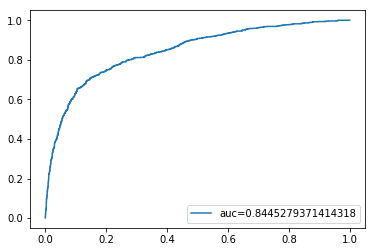

Area Under Curve AUC is  0.8445279371414318


In [157]:
y_pred_proba = fitcv.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()
print "Area Under Curve AUC is ", auc

In [158]:
fitcv.score(X_train, y_train)

0.8066771406127259

In [159]:
fitcv.score(X_test, y_test)

0.8099277411247251

In [160]:
print("Num Features: %d") % fitcv.n_features_

Num Features: 14


In [161]:
print("Selected Features: %s") % fitcv.support_

Selected Features: [ True  True  True  True  True  True  True  True  True  True  True  True  True  True]


In [162]:
lr_selected = fitcv.support_
lr_selected

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,  True,  True,  True,  True,  True])

In [163]:
lr_rank = fitcv.ranking_
print("Feature Ranking: %s") % fitcv.ranking_

Feature Ranking: [1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [165]:
lr_cols = X_train.columns.values
lr_cols

array(['DBHVCLY_2.0', 'BMI', 'DBHVPAN_2.0', 'DBHVWLY_2.0', 'CANEV_2.0', 'ASISTLV_4.0', 'AHCNOYR2', 'AHCNOYR2', 'BEDDAYR', 'DBHVCLN_2.0', 'AMDLONGR_1.0', 'AHCNOYR2', 'AHCNOYR2', 'FLA1AR_2'], dtype=object)

In [167]:
for i in range(len(lr_cols)):
    #if lr_selected[i]:
    print lr_cols[i],'\t', lr_rank[i] 

DBHVCLY_2.0 	1
BMI 	1
DBHVPAN_2.0 	1
DBHVWLY_2.0 	1
CANEV_2.0 	1
ASISTLV_4.0 	1
AHCNOYR2 	1
AHCNOYR2 	1
BEDDAYR 	1
DBHVCLN_2.0 	1
AMDLONGR_1.0 	1
AHCNOYR2 	1
AHCNOYR2 	1
FLA1AR_2 	1


In [168]:
#############################################################################################################

#logistic regression with cross validation using recursive feature elimination

#############################################################################################################

In [169]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.feature_selection import RFE


In [170]:
X_train.tail()

,DBHVCLY_2.0,BMI,DBHVPAN_2.0,DBHVWLY_2.0,CANEV_2.0,ASISTLV_4.0,AHCNOYR2,AHCNOYR2,BEDDAYR,DBHVCLN_2.0,AMDLONGR_1.0,AHCNOYR2,AHCNOYR2,FLA1AR_2
3537,1,2861.0,0,0,1,0,3.0,3.0,1.0,0,1,3.0,3.0,1
15043,1,2434.0,0,1,1,0,0.0,0.0,0.0,1,0,0.0,0.0,1
6536,0,2434.0,0,1,1,1,1.0,1.0,0.0,0,1,1.0,1.0,0
1778,0,5274.0,0,0,1,0,3.0,3.0,0.0,0,1,3.0,3.0,0
631,1,2240.0,0,1,0,0,8.0,8.0,0.0,0,1,8.0,8.0,0


In [171]:
LogRegCV = LogisticRegressionCV(cv=10, random_state=123231, multi_class='ovr')

In [172]:
rfe = RFE(LogRegCV,5)

In [173]:
fit = rfe.fit(X_train, y_train)

In [174]:
y_pred_cv = fit.predict(X_test)
y_pred_cv

array([0, 0, 1, ..., 1, 0, 0], dtype=uint8)

In [175]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred_cv)
confusion_matrix

array([[1942,  186],
       [ 434,  621]], dtype=int64)

In [176]:
lg = classification_report(y_test, y_pred_cv)
print lg
#print(classification_report(y_test, y_pred_cv))

             precision    recall  f1-score   support

          0       0.82      0.91      0.86      2128
          1       0.77      0.59      0.67      1055

avg / total       0.80      0.81      0.80      3183



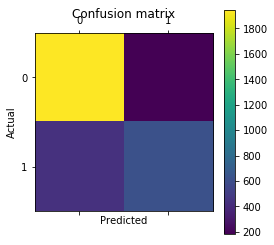

In [177]:
import pylab as plt
%matplotlib inline
plt.matshow(confusion_matrix)
plt.title('Confusion matrix')
plt.colorbar()
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [178]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_cv))
print("Precision:",metrics.precision_score(y_test, y_pred_cv))
print("Recall:",metrics.recall_score(y_test, y_pred_cv))

('Accuracy:', 0.80521520578071)
('Precision:', 0.7695167286245354)
('Recall:', 0.5886255924170616)


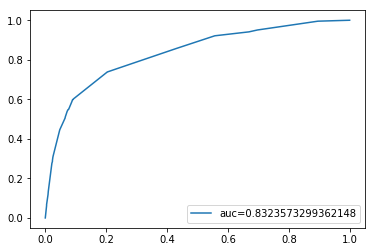

Area Under Curve AUC is  0.8323573299362148


In [179]:
y_pred_proba_cv = fit.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba_cv)
auc = metrics.roc_auc_score(y_test, y_pred_proba_cv)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()
print "Area Under Curve AUC is ", auc

In [180]:
fit.score(X_train, y_train)

0.80471327572663

In [181]:
fit.score(X_test, y_test)

0.80521520578071

In [182]:
print("Num Features: %d") % fit.n_features_

Num Features: 5


In [183]:

print("Selected Features: %s") % fit.support_

Selected Features: [ True False  True  True False False False False False False  True False False  True]


In [184]:
lr_selected = fit.support_
lr_selected

array([ True, False,  True,  True, False, False, False, False, False, False,  True, False, False,  True])

In [185]:
lr_rank = fit.ranking_
print("Feature Ranking: %s") % fit.ranking_

Feature Ranking: [ 1 10  1  1  3  2  7  6  9  8  1  5  4  1]


In [186]:
lr_cols = X_train.columns.values
lr_cols

array(['DBHVCLY_2.0', 'BMI', 'DBHVPAN_2.0', 'DBHVWLY_2.0', 'CANEV_2.0', 'ASISTLV_4.0', 'AHCNOYR2', 'AHCNOYR2', 'BEDDAYR', 'DBHVCLN_2.0', 'AMDLONGR_1.0', 'AHCNOYR2', 'AHCNOYR2', 'FLA1AR_2'], dtype=object)

In [187]:

for i in range(len(lr_cols)):
    #if lr_selected[i]:
    print lr_cols[i],'\t', lr_rank[i] 

DBHVCLY_2.0 	1
BMI 	10
DBHVPAN_2.0 	1
DBHVWLY_2.0 	1
CANEV_2.0 	3
ASISTLV_4.0 	2
AHCNOYR2 	7
AHCNOYR2 	6
BEDDAYR 	9
DBHVCLN_2.0 	8
AMDLONGR_1.0 	1
AHCNOYR2 	5
AHCNOYR2 	4
FLA1AR_2 	1


In [188]:
# varaibles selected: DBHVCLY_2.0, DBHVPAN_2.0, DBHVWLY_2.0, AMDLONGR_1.0, FLA1AR_2

In [189]:
###############################################################################################

# Logistic Regression using stasmodels.org api

#################################################################################################

In [190]:
import statsmodels.api as sm

In [191]:
hn.head()

,DBHVPAY_YES,DBHVCLY_2.0,BMI,DBHVPAN_2.0,DBHVWLY_2.0,CANEV_2.0,ASISTLV_4.0,AHCNOYR2,BEDDAYR,DBHVCLN_2.0,AMDLONGR_1.0,AHCNOYR2,FLA1AR_2
0,1,1,2930.0,0,1,1,1,2.0,0.0,0,0,2.0,1
1,0,0,3544.0,0,1,1,0,0.0,4.0,0,1,0.0,0
2,1,1,4313.0,0,1,1,1,3.0,6.0,0,1,3.0,1
3,0,1,3227.0,0,1,1,0,2.0,0.0,1,0,2.0,1
4,0,1,2467.0,0,1,1,0,2.0,0.0,0,1,2.0,1


In [192]:
ys = health_tree_drop['DBHVPAY_YES'] # y variable
Xs = health_tree_drop[health_names[1:]]


In [193]:
ys.tail()

15908    0
15909    0
15910    1
15911    1
15912    0
Name: DBHVPAY_YES, dtype: uint8

In [194]:
Xs.dtypes

SEX_2             uint8
R_MARITL_2        uint8
R_MARITL_3        uint8
R_MARITL_4        uint8
MRACRPI2_2        uint8
MRACRPI2_3        uint8
MRACRPI2_4        uint8
REGION_2          uint8
REGION_3          uint8
REGION_4          uint8
PAR_STAT_2        uint8
PAR_STAT_3        uint8
DOINGLWA_2.0      uint8
DOINGLWA_3.0      uint8
DOINGLWA_4.0      uint8
DOINGLWA_5.0      uint8
SUPERVIS_2.0      uint8
WRKCATA_2.0       uint8
WRKCATA_3.0       uint8
WRKCATA_4.0       uint8
WRKCATA_5.0       uint8
WRKCATA_6.0       uint8
HOURPDA_2.0       uint8
PDSICKA_2.0       uint8
WRKLYR4_1.0       uint8
WRKLYR4_2.0       uint8
HYPEV_2.0         uint8
HYBPLEV_2.0       uint8
HYBPLEV_3.0       uint8
HYBPLEV_4.0       uint8
                 ...   
ASIRETR_2.0       uint8
ASIRETR_3.0       uint8
ASIRETR_4.0       uint8
ASIMEDC_2.0       uint8
ASIMEDC_3.0       uint8
ASIMEDC_4.0       uint8
ASISTLV_2.0       uint8
ASISTLV_3.0       uint8
ASISTLV_4.0       uint8
ASICNHC_2.0       uint8
ASICNHC_3.0     

In [195]:
Xs.dtypes

SEX_2             uint8
R_MARITL_2        uint8
R_MARITL_3        uint8
R_MARITL_4        uint8
MRACRPI2_2        uint8
MRACRPI2_3        uint8
MRACRPI2_4        uint8
REGION_2          uint8
REGION_3          uint8
REGION_4          uint8
PAR_STAT_2        uint8
PAR_STAT_3        uint8
DOINGLWA_2.0      uint8
DOINGLWA_3.0      uint8
DOINGLWA_4.0      uint8
DOINGLWA_5.0      uint8
SUPERVIS_2.0      uint8
WRKCATA_2.0       uint8
WRKCATA_3.0       uint8
WRKCATA_4.0       uint8
WRKCATA_5.0       uint8
WRKCATA_6.0       uint8
HOURPDA_2.0       uint8
PDSICKA_2.0       uint8
WRKLYR4_1.0       uint8
WRKLYR4_2.0       uint8
HYPEV_2.0         uint8
HYBPLEV_2.0       uint8
HYBPLEV_3.0       uint8
HYBPLEV_4.0       uint8
                 ...   
ASIRETR_2.0       uint8
ASIRETR_3.0       uint8
ASIRETR_4.0       uint8
ASIMEDC_2.0       uint8
ASIMEDC_3.0       uint8
ASIMEDC_4.0       uint8
ASISTLV_2.0       uint8
ASISTLV_3.0       uint8
ASISTLV_4.0       uint8
ASICNHC_2.0       uint8
ASICNHC_3.0     

In [196]:
logit_model=sm.Logit(ys,Xs)
result=logit_model.fit()
print(result.summary2())

C:\Users\lenovo\Anaconda2\lib\site-packages\statsmodels\discrete\discrete_model.py:1674: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
C:\Users\lenovo\Anaconda2\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))


Optimization terminated successfully.
         Current function value: inf
         Iterations 7


C:\Users\lenovo\Anaconda2\lib\site-packages\statsmodels\base\model.py:488: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
C:\Users\lenovo\Anaconda2\lib\site-packages\statsmodels\base\model.py:488: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


                               Results: Logit
Model:                   Logit                 Pseudo R-squared:      inf   
Dependent Variable:      DBHVPAY_YES           AIC:                   inf   
Date:                    2018-11-19 22:52      BIC:                   inf   
No. Observations:        15913                 Log-Likelihood:        -inf  
Df Model:                140                   LL-Null:               0.0000
Df Residuals:            15772                 LLR p-value:           1.0000
Converged:               1.0000                Scale:                 1.0000
No. Iterations:          7.0000                                             
----------------------------------------------------------------------------
              Coef.    Std.Err.      z     P>|z|      [0.025       0.975]   
----------------------------------------------------------------------------
SEX_2         0.2126       0.0658   3.2303 0.0012        0.0836       0.3415
R_MARITL_2   -0.1097       0.0

In [197]:
cols=['SEX_2',	'MRACRPI2_4',	'WRKCATA_2.0',	'WRKCATA_5.0',	'HOURPDA_2.0',	'PDSICKA_2.0',	'HYPEV_2.0',	'HYBPLEV_5.0',	'CHLEV_2.0',	'CANEV_2.0',	'DBHVCLY_2.0',	'DBHVWLY_2.0',	'DBHVPAN_2.0',	'DBHVCLN_2.0',	'DBHVWLN_2.0',	'DIBREL_2.0',	'DIBPRE2_2.0',	'AHEARST1_2.0',	'AHEARST1_4.0',	'AHEARST1_6.0',	'VIMGLASS_2.0',	'AVISACT_2.0',	'FLA1AR_2',	'APLKIND_5.0',	'AMDLONGR_4.0',	'AMDLONGR_5.0',	'HIT1A_2.0',	'HIT4A_2.0',	'ASICPUSE_2.0',	'ASICPUSE_4.0',	'ASIMEDC_2.0',	'ASISTLV_4.0',	'AWEBUSE_2.0',	'YTQU_YG1_2.0',	'ASISLEEP',	'BMI',	'AHCNOYR2']
cols[0:5]


['SEX_2', 'MRACRPI2_4', 'WRKCATA_2.0', 'WRKCATA_5.0', 'HOURPDA_2.0']

In [198]:
Xs2= health_tree_drop[cols]
Xs2[0:5]

,SEX_2,MRACRPI2_4,WRKCATA_2.0,WRKCATA_5.0,HOURPDA_2.0,PDSICKA_2.0,HYPEV_2.0,HYBPLEV_5.0,CHLEV_2.0,CANEV_2.0,...,HIT4A_2.0,ASICPUSE_2.0,ASICPUSE_4.0,ASIMEDC_2.0,ASISTLV_4.0,AWEBUSE_2.0,YTQU_YG1_2.0,ASISLEEP,BMI,AHCNOYR2
0,1,0,0,0,0,1,0,0,0,1,...,1,0,1,0,1,0,1,8.0,2930.0,2.0
1,0,0,0,0,0,0,1,0,1,1,...,1,0,0,1,0,0,1,5.0,3544.0,0.0
2,1,0,0,0,0,0,1,0,1,1,...,1,0,1,0,1,0,0,8.0,4313.0,3.0
3,0,0,0,0,0,0,1,0,1,1,...,1,0,1,0,0,0,0,8.0,3227.0,2.0
4,1,0,0,1,1,1,1,0,0,1,...,1,1,0,0,0,0,1,7.0,2467.0,2.0


In [199]:
ys2= ys
ys2.head()


0    1
1    0
2    1
3    0
4    0
Name: DBHVPAY_YES, dtype: uint8

In [200]:
logit_model2=sm.Logit(ys2,Xs2)
result2=logit_model2.fit()
print(result2.summary2())

Optimization terminated successfully.
         Current function value: inf
         Iterations 7


C:\Users\lenovo\Anaconda2\lib\site-packages\statsmodels\base\model.py:488: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
C:\Users\lenovo\Anaconda2\lib\site-packages\statsmodels\base\model.py:488: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


                       Results: Logit
Model:              Logit            Pseudo R-squared: inf   
Dependent Variable: DBHVPAY_YES      AIC:              inf   
Date:               2018-11-19 22:52 BIC:              inf   
No. Observations:   15913            Log-Likelihood:   -inf  
Df Model:           36               LL-Null:          0.0000
Df Residuals:       15876            LLR p-value:      1.0000
Converged:          1.0000           Scale:            1.0000
No. Iterations:     7.0000                                   
-------------------------------------------------------------
              Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-------------------------------------------------------------
SEX_2         0.1426   0.0476   2.9957 0.0027  0.0493  0.2360
MRACRPI2_4    0.5928   0.0921   6.4353 0.0000  0.4122  0.7733
WRKCATA_2.0  -0.2586   0.1106  -2.3386 0.0194 -0.4752 -0.0419
WRKCATA_5.0  -0.2313   0.0878  -2.6348 0.0084 -0.4033 -0.0592
HOURPDA_2.0   0.2143   0.0459   

In [201]:
#crate test train
X_train2, X_test2, y_train2, y_test2 = train_test_split(Xs2, ys2, test_size=0.2, random_state=2323)
LogReg3 = LogisticRegression()
LogReg3.fit(X_train2, y_train2)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [202]:
#predict y
y_pred2 = LogReg3.predict(X_test2)
print('Accuracy : {:.2f}'.format(LogReg3.score(X_test2, y_test2)))

Accuracy : 0.81


In [203]:
#conf matrix
from sklearn.metrics import confusion_matrix
confusion_matrix3 = confusion_matrix(y_test2, y_pred2)
print(confusion_matrix3)

[[1949  206]
 [ 383  645]]


In [204]:
lg2 = classification_report(y_test2, y_pred2)
print lg2

             precision    recall  f1-score   support

          0       0.84      0.90      0.87      2155
          1       0.76      0.63      0.69      1028

avg / total       0.81      0.81      0.81      3183



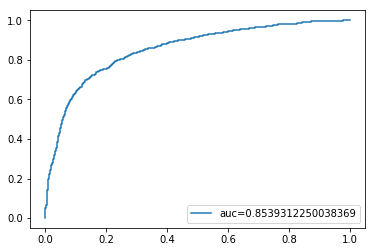

Area Under Curve AUC is  0.8539312250038369


In [205]:
y_pred_proba2 = LogReg3.predict_proba(X_test2)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test2,  y_pred_proba2)
auc = metrics.roc_auc_score(y_test2, y_pred_proba2)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()
print "Area Under Curve AUC is ", auc

In [206]:
##############################################################################################################

#LDA

##############################################################################################################

In [207]:
ldclf = LinearDiscriminantAnalysis()
ldclf = ldclf.fit(X_train, y_train)
print "Score on Training: ", ldclf.score(X_train, y_train)
print "Score on Test: ", ldclf.score(X_test, y_test)

Score on Training:  0.806598586017282
Score on Test:  0.8080427269871191


C:\Users\lenovo\Anaconda2\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


In [208]:
# 10-fold cross validation
cv_scores = cross_validation.cross_val_score(ldclf, X, y, cv=5)
cv_scores

C:\Users\lenovo\Anaconda2\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
C:\Users\lenovo\Anaconda2\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
C:\Users\lenovo\Anaconda2\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
C:\Users\lenovo\Anaconda2\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
C:\Users\lenovo\Anaconda2\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


array([0.81, 0.81, 0.79, 0.82, 0.8 ])

In [209]:
print("Overall Accuracy: %0.2f (+/- %0.2f)" % (cv_scores.mean(), cv_scores.std() * 2))

Overall Accuracy: 0.81 (+/- 0.02)


In [222]:
##############################################################################################################

#Clustering numerical variables

##############################################################################################################

In [223]:
health_cl = health_tree
print health_cl.shape
health_cl.tail()


(15913, 143)


,DBHVPAY_YES,SEX_2,R_MARITL_2,R_MARITL_3,R_MARITL_4,MRACRPI2_2,MRACRPI2_3,MRACRPI2_4,REGION_2,REGION_3,...,ALCSTAT_9,ALCSTAT_10,YRSWRKPA,ASISLEEP,AHEIGHT,BMI,BEDDAYR,CLCKTP,AHCNOYR2,LOCALL1B
15908,0,1,1,0,0,0,0,0,0,0,...,0,0,30.0,7.0,63.0,1984.0,30.0,3,8.0,4.0
15909,0,1,0,0,0,0,0,0,0,0,...,0,0,1.0,8.0,66.0,2051.0,0.0,3,4.0,3.0
15910,1,1,1,0,0,0,0,0,0,1,...,0,0,2.0,8.0,67.0,3601.0,1.0,3,2.0,4.0
15911,1,1,0,0,0,1,0,0,0,1,...,0,0,18.0,7.0,64.0,3775.0,0.0,3,3.0,3.0
15912,0,1,0,0,0,0,0,0,0,1,...,0,0,6.0,8.0,66.0,1858.0,2.0,4,4.0,6.0


In [224]:
health_cl_num = health_cl[['YRSWRKPA','ASISLEEP','AHEIGHT','BMI','BEDDAYR','CLCKTP','AHCNOYR2','LOCALL1B']]
health_cl_num.tail()

,YRSWRKPA,ASISLEEP,AHEIGHT,BMI,BEDDAYR,CLCKTP,AHCNOYR2,LOCALL1B
15908,30.0,7.0,63.0,1984.0,30.0,3,8.0,4.0
15909,1.0,8.0,66.0,2051.0,0.0,3,4.0,3.0
15910,2.0,8.0,67.0,3601.0,1.0,3,2.0,4.0
15911,18.0,7.0,64.0,3775.0,0.0,3,3.0,3.0
15912,6.0,8.0,66.0,1858.0,2.0,4,4.0,6.0


In [225]:
#min max normalization of numerical variables
x = health_cl_num.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
health_cl_num_norm = pd.DataFrame(x_scaled, columns=health_cl_num.columns)
health_cl_num_norm.columns = ['YRSWRKPA_NORM','ASISLEEP_NORM','AHEIGHT_NORM','BMI_NORM','BEDDAYR_NORM','CLCKTP_NORM','AHCNOYR2_NORM','LOCALL1B_NORM']

health_cl_num_norm.head()

,YRSWRKPA_NORM,ASISLEEP_NORM,AHEIGHT_NORM,BMI_NORM,BEDDAYR_NORM,CLCKTP_NORM,AHCNOYR2_NORM,LOCALL1B_NORM
0,0.800000,0.368421,0.117647,0.375267,0.000000,0.444444,0.250,0.500
1,0.371429,0.210526,0.588235,0.538913,0.010959,0.333333,0.000,0.875
2,0.371429,0.368421,0.176471,0.743870,0.016438,0.111111,0.375,0.625
3,0.457143,0.368421,0.235294,0.454424,0.000000,0.333333,0.250,1.000
4,0.628571,0.315789,0.176471,0.251866,0.000000,0.333333,0.250,0.250


In [226]:
health_cl_num_norm.dtypes

YRSWRKPA_NORM    float64
ASISLEEP_NORM    float64
AHEIGHT_NORM     float64
BMI_NORM         float64
BEDDAYR_NORM     float64
CLCKTP_NORM      float64
AHCNOYR2_NORM    float64
LOCALL1B_NORM    float64
dtype: object

In [227]:
#Xcl = np.array(health_cl2.drop(['DBHVPAY_YES'], 1).astype(float64))
#Xcl = np.array(health_cl2.drop(['DBHVPAY_YES'], 1))
Xcl = np.array(health_cl_num_norm)


In [228]:
Xcl[0:5]

array([[0.8 , 0.37, 0.12, 0.38, 0.  , 0.44, 0.25, 0.5 ],
       [0.37, 0.21, 0.59, 0.54, 0.01, 0.33, 0.  , 0.88],
       [0.37, 0.37, 0.18, 0.74, 0.02, 0.11, 0.38, 0.62],
       [0.46, 0.37, 0.24, 0.45, 0.  , 0.33, 0.25, 1.  ],
       [0.63, 0.32, 0.18, 0.25, 0.  , 0.33, 0.25, 0.25]])

In [231]:
#
kmeans = KMeans(n_clusters=5, max_iter=500, verbose = 0)
kmeans.fit(Xcl)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [233]:
#categorical dataset
health_cl1 = health_cl.iloc[:,0:135]
health_cl1.tail()

,DBHVPAY_YES,SEX_2,R_MARITL_2,R_MARITL_3,R_MARITL_4,MRACRPI2_2,MRACRPI2_3,MRACRPI2_4,REGION_2,REGION_3,...,AWEBUSE_2.0,YTQU_YG1_2.0,ALCSTAT_2,ALCSTAT_3,ALCSTAT_5,ALCSTAT_6,ALCSTAT_7,ALCSTAT_8,ALCSTAT_9,ALCSTAT_10
15908,0,1,1,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
15909,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
15910,1,1,1,0,0,0,0,0,0,1,...,0,1,0,0,0,0,1,0,0,0
15911,1,1,0,0,0,1,0,0,0,1,...,0,1,0,0,1,0,0,0,0,0
15912,0,1,0,0,0,0,0,0,0,1,...,0,1,0,0,0,1,0,0,0,0


In [234]:
#merge 
health_cl2 = pd.concat([health_cl1,health_cl_num_norm],axis=1,join_axes=[health_cl1.index])
health_cl2.tail()

,DBHVPAY_YES,SEX_2,R_MARITL_2,R_MARITL_3,R_MARITL_4,MRACRPI2_2,MRACRPI2_3,MRACRPI2_4,REGION_2,REGION_3,...,ALCSTAT_9,ALCSTAT_10,YRSWRKPA_NORM,ASISLEEP_NORM,AHEIGHT_NORM,BMI_NORM,BEDDAYR_NORM,CLCKTP_NORM,AHCNOYR2_NORM,LOCALL1B_NORM
15908,0,1,1,0,0,0,0,0,0,0,...,0,0,0.857143,0.315789,0.235294,0.123134,0.082192,0.333333,1.000,0.375
15909,0,1,0,0,0,0,0,0,0,0,...,0,0,0.028571,0.368421,0.411765,0.140991,0.000000,0.333333,0.500,0.250
15910,1,1,1,0,0,0,0,0,0,1,...,0,0,0.057143,0.368421,0.470588,0.554104,0.002740,0.333333,0.250,0.375
15911,1,1,0,0,0,1,0,0,0,1,...,0,0,0.514286,0.315789,0.294118,0.600480,0.000000,0.333333,0.375,0.250
15912,0,1,0,0,0,0,0,0,0,1,...,0,0,0.171429,0.368421,0.411765,0.089552,0.005479,0.444444,0.500,0.625


In [235]:
#Xcl = np.array(health_cl2.drop(['DBHVPAY_YES'], 1).astype(float64))
#Xcl = np.array(health_cl2.drop(['DBHVPAY_YES'], 1))
Xcl = np.array(health_cl_num_norm)

In [236]:
Xcl[0:5]

array([[0.8 , 0.37, 0.12, 0.38, 0.  , 0.44, 0.25, 0.5 ],
       [0.37, 0.21, 0.59, 0.54, 0.01, 0.33, 0.  , 0.88],
       [0.37, 0.37, 0.18, 0.74, 0.02, 0.11, 0.38, 0.62],
       [0.46, 0.37, 0.24, 0.45, 0.  , 0.33, 0.25, 1.  ],
       [0.63, 0.32, 0.18, 0.25, 0.  , 0.33, 0.25, 0.25]])

In [237]:
ycl = np.array(health_cl2['DBHVPAY_YES'])

In [238]:
ycl[0:5]

array([1, 0, 1, 0, 0], dtype=uint8)

In [239]:
#
kmeans = KMeans(n_clusters=5, max_iter=500, verbose = 1)
kmeans.fit(Xcl)

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 3772.6783379936574
start iteration
done sorting
end inner loop
Iteration 1, inertia 3550.2887727135435
start iteration
done sorting
end inner loop
Iteration 2, inertia 3437.0332058683
start iteration
done sorting
end inner loop
Iteration 3, inertia 3350.404469284882
start iteration
done sorting
end inner loop
Iteration 4, inertia 3294.192427004905
start iteration
done sorting
end inner loop
Iteration 5, inertia 3264.3444804081423
start iteration
done sorting
end inner loop
Iteration 6, inertia 3249.883683426932
start iteration
done sorting
end inner loop
Iteration 7, inertia 3238.4031167018115
start iteration
done sorting
end inner loop
Iteration 8, inertia 3228.273151601613
start iteration
done sorting
end inner loop
Iteration 9, inertia 3218.164408140118
start iteration
done sorting
end inner loop
Iteration 10, inertia 3208.175158089976
start iteration
done sorting
end inner loop
Iteration 11, in

done sorting
end inner loop
Iteration 24, inertia 3113.4215591041398
start iteration
done sorting
end inner loop
Iteration 25, inertia 3112.695225472834
start iteration
done sorting
end inner loop
Iteration 26, inertia 3112.134256504857
start iteration
done sorting
end inner loop
Iteration 27, inertia 3112.078825222901
start iteration
done sorting
end inner loop
Iteration 28, inertia 3112.071393742658
center shift 1.932050e-03 within tolerance 4.675494e-06
Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 3609.3214467635153
start iteration
done sorting
end inner loop
Iteration 1, inertia 3333.1362833994463
start iteration
done sorting
end inner loop
Iteration 2, inertia 3265.0547612637006
start iteration
done sorting
end inner loop
Iteration 3, inertia 3234.3516894467853
start iteration
done sorting
end inner loop
Iteration 4, inertia 3209.867021647541
start iteration
done sorting
end inner loop
Iteration 5, inertia 3179.4107483621556
start iterat

end inner loop
Iteration 21, inertia 3218.5209910482495
start iteration
done sorting
end inner loop
Iteration 22, inertia 3183.5864101665334
start iteration
done sorting
end inner loop
Iteration 23, inertia 3146.6321645420267
start iteration
done sorting
end inner loop
Iteration 24, inertia 3128.676520238006
start iteration
done sorting
end inner loop
Iteration 25, inertia 3118.305847115342
start iteration
done sorting
end inner loop
Iteration 26, inertia 3113.608566079179
start iteration
done sorting
end inner loop
Iteration 27, inertia 3112.726632803999
start iteration
done sorting
end inner loop
Iteration 28, inertia 3112.4866327783648
start iteration
done sorting
end inner loop
Iteration 29, inertia 3112.356412994389
start iteration
done sorting
end inner loop
Iteration 30, inertia 3112.2664327257967
start iteration
done sorting
end inner loop
Iteration 31, inertia 3112.193698492989
start iteration
done sorting
end inner loop
Iteration 32, inertia 3112.161035466959
start iteration


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=1)

In [240]:
clusters = kmeans.predict(Xcl)
print clusters

[2 4 4 ... 0 2 4]


In [241]:
clusters.shape

(15913L,)

In [242]:
ycl.shape

(15913L,)

In [243]:
print completeness_score(ycl,clusters)

0.004936787674073858


In [244]:
print homogeneity_score(ycl,clusters)

0.011846832712906218


In [ ]:
#this clustering model cannot be used, it was an experiment for clustering numerical data with binary y variable.  